<a href="https://colab.research.google.com/github/SergeiVKalinin/MSE_Fall_2025/blob/main/Module%204/Midterm_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Midterm 1, MSE 504, 2025**

**Date:** 10/12/2025

**Name:** Agnila Ghosh Surovi

**Department:** Mechanical and Aerospace Engineering

# I. Element Analysis

Use the Matminer to create a table of element descriptors, and explore correlations and classification.

In [ ]:
!pip install matminer
!pip install mdf_forge
!pip -q install mdf-toolbox mdf-forge
!pip install figrecipes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 94.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.9/51.9 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 331.1/331.1 kB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 809.1/809.1 kB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 753.1/753.1 kB 42.3 MB/s eta 0:00:00
  Created wheel for bibtexparser: filename=bibtexparser-1.4.3-py3-none-any.whl size=4354

1. Download the MatMiner data set of your choice (e.g. castelli perovskites, mechanical properties, JARVIS data sets, etc). The instructions will be on https://hackingmaterials.lbl.gov/matminer/dataset_summary.html. Choose the data set that best aligns with your research interests. Ideally, the data set will contain composition information and several properties. Use the notebooks on course GitHub or (even better) original MatMiner website as examples.

## Answer 1

The **Mechanical Properties** dataset is most relevant since my research work on elasticity, poroelasticity, viscoelasticity and contact. It will represent how elastic moduli correlate with elemental descriptors.

In [ ]:
# Load a dataset with composition + multiple mechanical properties
from matminer.datasets import load_dataset
df_raw = load_dataset("elastic_tensor_2015")   # MP elastic dataset

print(df_raw.shape)
df_raw.head()

Fetching elastic_tensor_2015.json.gz from https://ndownloader.figshare.com/files/13220603 to /usr/local/lib/python3.12/dist-packages/matminer/datasets/elastic_tensor_2015.json.gz


Fetching https://ndownloader.figshare.com/files/13220603 in MB: 1.1182079999999999MB [00:00, 255.74MB/s]                


(1181, 20)


,material_id,formula,nsites,space_group,volume,structure,elastic_anisotropy,G_Reuss,G_VRH,G_Voigt,K_Reuss,K_VRH,K_Voigt,poisson_ratio,compliance_tensor,elastic_tensor,elastic_tensor_original,cif,kpoint_density,poscar
0,mp-10003,Nb4CoSi,12,124,194.419802,"[[0.94814328 2.07280467 2.5112 ] Nb, [5.273...",0.030688,96.844535,97.141604,97.438674,194.267623,194.268884,194.270146,0.285701,"[[0.004385293093993, -0.0016070693558990002, -...","[[311.33514638650246, 144.45092552856926, 126....","[[311.33514638650246, 144.45092552856926, 126....",#\#CIF1.1\n###################################...,7000,Nb8 Co2 Si2\n1.0\n6.221780 0.000000 0.000000\n...
1,mp-10010,Al(CoSi)2,5,164,61.987320,"[[0. 0. 0.] Al, [1.96639263 1.13529553 0.75278...",0.266910,93.939650,96.252006,98.564362,173.647763,175.449907,177.252050,0.268105,"[[0.0037715428949660003, -0.000844229828709, -...","[[306.93357350984974, 88.02634955100905, 105.6...","[[306.93357350984974, 88.02634955100905, 105.6...",#\#CIF1.1\n###################################...,7000,Al1 Co2 Si2\n1.0\n3.932782 0.000000 0.000000\n...
2,mp-10015,SiOs,2,221,25.952539,"[[1.480346 1.480346 1.480346] Si, [0. 0. 0.] Os]",0.756489,120.962289,130.112955,139.263621,295.077545,295.077545,295.077545,0.307780,"[[0.0019959391925840004, -0.000433146670736000...","[[569.5291276937579, 157.8517489654999, 157.85...","[[569.5291276937579, 157.8517489654999, 157.85...",#\#CIF1.1\n###################################...,7000,Si1 Os1\n1.0\n2.960692 0.000000 0.000000\n0.00...
3,mp-10021,Ga,4,63,76.721433,"[[0. 1.09045794 0.84078375] Ga, [0. ...",2.376805,12.205989,15.101901,17.997812,49.025963,49.130670,49.235377,0.360593,"[[0.021647143908635, -0.005207263618160001, -0...","[[69.28798774976904, 34.7875015216915, 37.3877...","[[70.13259066665267, 40.60474945058445, 37.387...",#\#CIF1.1\n###################################...,7000,Ga4\n1.0\n2.803229 0.000000 0.000000\n0.000000...
4,mp-10025,SiRu2,12,62,160.300999,"[[1.0094265 4.24771709 2.9955487 ] Si, [3.028...",0.196930,100.110773,101.947798,103.784823,255.055257,256.768081,258.480904,0.324682,"[[0.00410214297725, -0.001272204332729, -0.001...","[[349.3767766177825, 186.67131003104407, 176.4...","[[407.4791016459293, 176.4759188081947, 213.83...",#\#CIF1.1\n###################################...,7000,Si4 Ru8\n1.0\n4.037706 0.000000 0.000000\n0.00...


In [ ]:
keep = ["material_id","formula","nsites","space_group","volume",
        "G_Reuss","G_VRH","G_Voigt","K_Reuss","K_VRH","K_Voigt","poisson_ratio"]

df = df_raw[keep]
print(df.shape)
df.head()

(1181, 12)


,material_id,formula,nsites,space_group,volume,G_Reuss,G_VRH,G_Voigt,K_Reuss,K_VRH,K_Voigt,poisson_ratio
0,mp-10003,Nb4CoSi,12,124,194.419802,96.844535,97.141604,97.438674,194.267623,194.268884,194.270146,0.285701
1,mp-10010,Al(CoSi)2,5,164,61.987320,93.939650,96.252006,98.564362,173.647763,175.449907,177.252050,0.268105
2,mp-10015,SiOs,2,221,25.952539,120.962289,130.112955,139.263621,295.077545,295.077545,295.077545,0.307780
3,mp-10021,Ga,4,63,76.721433,12.205989,15.101901,17.997812,49.025963,49.130670,49.235377,0.360593
4,mp-10025,SiRu2,12,62,160.300999,100.110773,101.947798,103.784823,255.055257,256.768081,258.480904,0.324682


2. Featurize the data set, e.g. using compositional and structural MagPie features.

In [ ]:
from matminer.featurizers.composition import ElementProperty
from pymatgen.core import Composition

# Convert formula strings to Composition objects
df["composition_obj"] = df["formula"].apply(Composition)

# Add Magpie compositional features
ep = ElementProperty.from_preset("magpie")
df_feat = ep.featurize_dataframe(df, "composition_obj")

df_feat.head()


/tmp/ipython-input-1965573607.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["composition_obj"] = df["formula"].apply(Composition)
/usr/local/lib/python3.12/dist-packages/matminer/utils/data.py:326: UserWarning: MagpieData(impute_nan=False):
In a future release, impute_nan will be set to True by default.
                    This means that features that are missing or are NaNs for elements
                    from the data source will be replaced by the average of that value
                    over the available elements.
                    This avoids NaNs after featurization that are often replaced by
                    dataset-dependent averages.
  warnings.warn(f"{self.__class__.__name__}(impute_nan=False):\n" + IMPUTE_NAN_WARNING)

ElementProperty:   0%|          | 0/1181 [00:00<?, ?it/s]

,material_id,formula,nsites,space_group,volume,G_Reuss,G_VRH,G_Voigt,K_Reuss,K_VRH,...,MagpieData range GSmagmom,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber
0,mp-10003,Nb4CoSi,12,124,194.419802,96.844535,97.141604,97.438674,194.267623,194.268884,...,1.548471,0.258079,0.430131,0.0,194.0,229.0,35.0,222.833333,9.611111,229.0
1,mp-10010,Al(CoSi)2,5,164,61.987320,93.939650,96.252006,98.564362,173.647763,175.449907,...,1.548471,0.619388,0.743266,0.0,194.0,227.0,33.0,213.400000,15.520000,194.0
2,mp-10015,SiOs,2,221,25.952539,120.962289,130.112955,139.263621,295.077545,295.077545,...,0.000000,0.000000,0.000000,0.0,194.0,227.0,33.0,210.500000,16.500000,194.0
3,mp-10021,Ga,4,63,76.721433,12.205989,15.101901,17.997812,49.025963,49.130670,...,0.000000,0.000000,0.000000,0.0,64.0,64.0,0.0,64.000000,0.000000,64.0
4,mp-10025,SiRu2,12,62,160.300999,100.110773,101.947798,103.784823,255.055257,256.768081,...,0.000000,0.000000,0.000000,0.0,194.0,227.0,33.0,205.000000,14.666667,194.0


With this, you will get a data set containing certain number of compounds, their properties (dependent on the data set you have chosen it can be bandgap, mechanical, dielectric constants, etc), and an associated descriptor vector.

### Problem I.1. Clustering of Elements

I.1.1. Now, create labels. You can:
- Use your property column to classify the materials as metals (bandgap <0.01, semiconductors (0.0.1 < bandgap < 0.3), and dielectrics (bandgap >0.3).
- Or do the same for the mechnical properties, melting temperatures, and so on. Note that this classification will be somewhat ad hoc (but then classification based on numerical parameters is a special case of regression)

With that, using the MagPie features, show the
- UMap
- t-SNE

representations. Visualize the distribution of classes in this space by superimposing the class labels on top of the graphs.

#### Answer I.1.1

I have divided K_VRH, bulk modulus into three classes:
1. low; if $0 \le$ K_VRH $< 100$
2. medium; if $100 \le$ K_VRH $< 200$
3. high; if $200 \le$ K_VRH

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


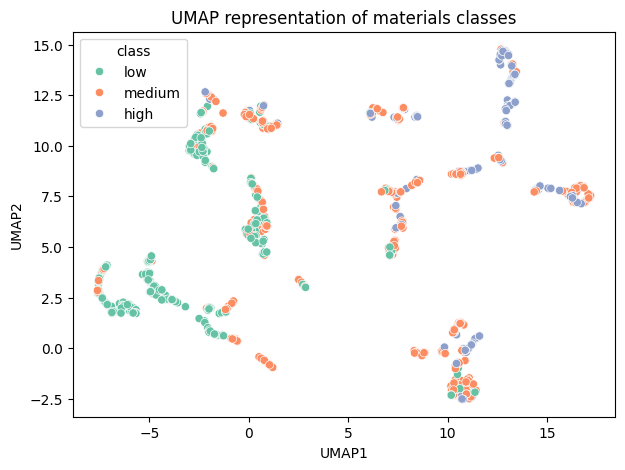

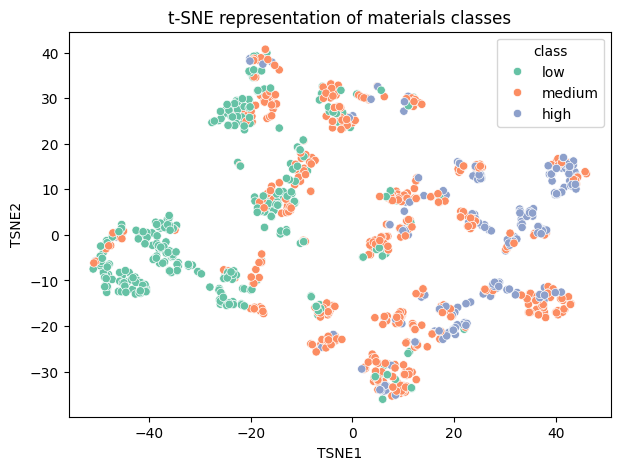

In [ ]:
# --- Create labels based on mechanical property (K_VRH) ---
import numpy as np
import pandas as pd

# Create a new column 'class' based on the condition
# classify materials by bulk modulus into low, medium, or high stiffness groups.
df_feat["class"] = pd.cut(df_feat["K_VRH"],
                          bins=[0, 100, 200, np.inf],
                          labels=["low", "medium", "high"])

# --- Dimensionality reduction (UMap + t-SNE) ---
from umap import UMAP
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numerical Magpie features
# select_dtypes(include=[float, int]) → keeps only numeric columns from dataset (df_feat).
# These are the Magpie features and numeric properties.
# Non-numeric columns (like formula, space_group, etc.) are ignored.
# .drop(columns=[...]) removes the target property columns (K_VRH, G_VRH, poisson_ratio)
# because we want UMAP/t-SNE to visualize based only on descriptors,
# not on the output we’re trying to predict.
X = df_feat.select_dtypes(include=[float, int]).drop(columns=["K_VRH", "G_VRH", "poisson_ratio"], errors="ignore")

# Replaces any missing values (NaN) in X with zeros.
# This is needed because algorithms like UMAP and t-SNE can’t handle missing numbers.
X = X.fillna(0)

# UMAP
umap = UMAP(n_neighbors=15, min_dist=0.1, random_state=0)
X_umap = umap.fit_transform(X)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, perplexity=30)
X_tsne = tsne.fit_transform(X)

# Add to dataframe
df_feat["UMAP1"], df_feat["UMAP2"] = X_umap[:,0], X_umap[:,1]
df_feat["TSNE1"], df_feat["TSNE2"] = X_tsne[:,0], X_tsne[:,1]

# --- Plot UMAP ---
plt.figure(figsize=(7,5))
sns.scatterplot(data=df_feat, x="UMAP1", y="UMAP2", hue="class", palette="Set2")
plt.title("UMAP representation of materials classes")
plt.show()

# --- Plot t-SNE ---
plt.figure(figsize=(7,5))
sns.scatterplot(data=df_feat, x="TSNE1", y="TSNE2", hue="class", palette="Set2")
plt.title("t-SNE representation of materials classes")
plt.show()


I.1.2. Dimensionality reduction. Use PCA to dimensionally reduce the magPie labels.
- Plot the resulting data sets using the labels you have created. Is any strucutre obvious in the distributions?
- Plot the strucutre of the PCA eigenvectors.

#### Answer I.1.2

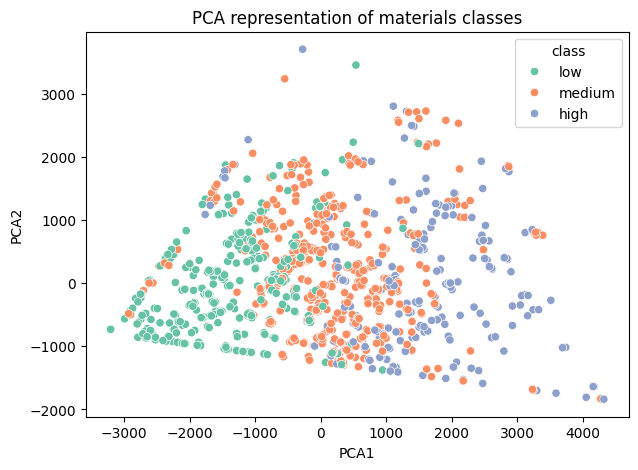

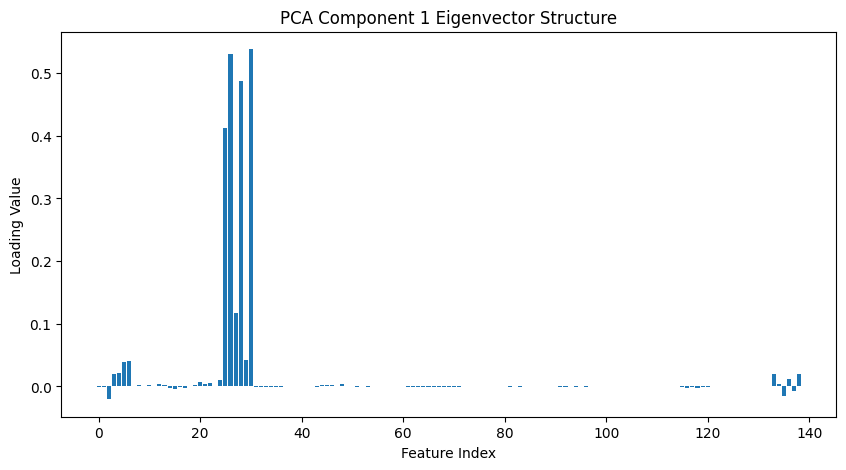

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# --- PCA dimensionality reduction ---
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X)

df_feat["PCA1"], df_feat["PCA2"] = X_pca[:,0], X_pca[:,1]

# --- Plot PCA with class labels ---
plt.figure(figsize=(7,5))
sns.scatterplot(data=df_feat, x="PCA1", y="PCA2", hue="class", palette="Set2")
plt.title("PCA representation of materials classes")
plt.show()

# --- Plot PCA eigenvector structure (loadings) ---
plt.figure(figsize=(10,5))
plt.bar(range(len(pca.components_[0])), pca.components_[0])
plt.title("PCA Component 1 Eigenvector Structure")
plt.xlabel("Feature Index")
plt.ylabel("Loading Value")
plt.show()


In the PCA projection, the materials show partial clustering by stiffness class. The low-modulus materials (green) generally occupy one side of the plot, while high-modulus materials (blue) tend to separate toward the opposite side. However, the classes overlap considerably, indicating that the first two principal components capture some, but not all, of the variation related to mechanical stiffness.

I.1.3. Use the GMM to cluster the MagPie descriptors.
- Visualize the GMM labels in the PCA space for descripotrs
- Calculate the correlation matrics between your clases and GMM descriptors.

#### Answer I.1.3

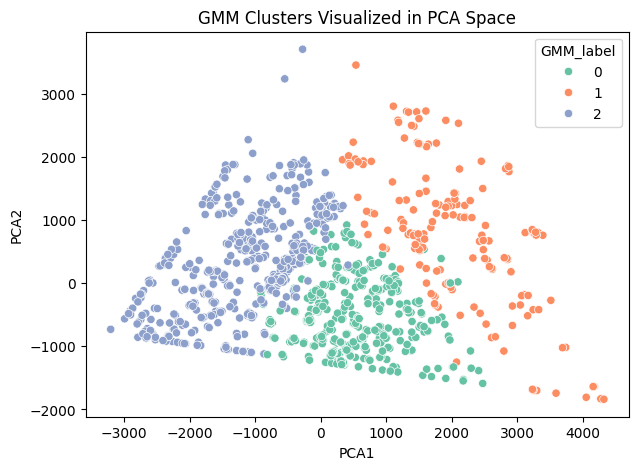

Correlation matrix between classes and GMM clusters:
           class_num  GMM_label
class_num   1.000000  -0.524458
GMM_label  -0.524458   1.000000


In [ ]:
from sklearn.mixture import GaussianMixture
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# --- GMM clustering on Magpie descriptors ---
gmm = GaussianMixture(n_components=3, random_state=0)
df_feat["GMM_label"] = gmm.fit_predict(X)

# --- Visualize GMM clusters in PCA space ---
plt.figure(figsize=(7,5))
sns.scatterplot(data=df_feat, x="PCA1", y="PCA2", hue="GMM_label", palette="Set2")
plt.title("GMM Clusters Visualized in PCA Space")
plt.show()

# --- Correlation matrix between GMM clusters and mechanical classes ---
# Convert categorical labels to numeric
df_feat["class_num"] = df_feat["class"].map({"low":0, "medium":1, "high":2})

corr = df_feat[["class_num", "GMM_label"]].corr()
print("Correlation matrix between classes and GMM clusters:")
print(corr)


The GMM clustering in PCA space shows three distinct regions that correspond closely to the predefined stiffness classes. Cluster 2 mainly overlaps with low-stiffness materials, Cluster 0 with medium, and Cluster 1 with high stiffness. This alignment indicates that the GMM successfully identified meaningful groups in the Magpie descriptor space that reflect underlying mechanical-property trends, even though the cluster labels are assigned in a different numerical order.

I.1.4. Perform the Canonical Correlation Analysis between the MagPie descriptors and the properties. Show the CCA scores and eigenvecotrs. Using domain intuition and ChatGPT, explore the meaning of correlations.

#### Answer I.1.4

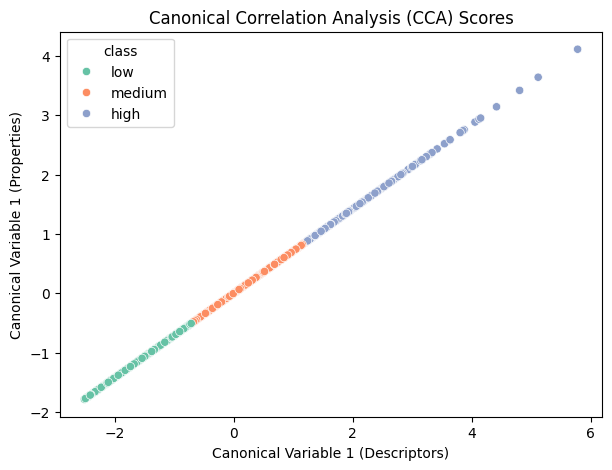

Canonical correlations (eigenvalues): [np.float64(0.9999999999998308), np.float64(0.6850009165282713)]

Top contributing Magpie descriptors for first canonical component:
                             CCA1_Loading
K_Reuss                          0.710281
K_Voigt                          0.703913
PCA1                             0.002227
MagpieData mode MeltingT         0.000764
MagpieData minimum MeltingT      0.000598
MagpieData mean MeltingT         0.000550
MagpieData maximum MeltingT      0.000528
PCA2                             0.000275
MagpieData range MeltingT        0.000034
MagpieData mean Number           0.000008


In [ ]:
from sklearn.cross_decomposition import CCA

# --- Select Magpie descriptors (X) and mechanical properties (Y) ---
X = df_feat.select_dtypes(include=[float, int]).drop(
    columns=["K_VRH","G_VRH","poisson_ratio","class_num","GMM_label"],
    errors="ignore"
)
X = X.fillna(0)

Y = df_feat[["K_VRH","G_VRH","poisson_ratio"]].fillna(0)

# --- Perform Canonical Correlation Analysis ---
cca = CCA(n_components=2)
X_c, Y_c = cca.fit_transform(X, Y)

# --- CCA scores ---
df_feat["CCA1_X"], df_feat["CCA2_X"] = X_c[:,0], X_c[:,1]
df_feat["CCA1_Y"], df_feat["CCA2_Y"] = Y_c[:,0], Y_c[:,1]

# --- Plot canonical scores ---
plt.figure(figsize=(7,5))
sns.scatterplot(x=df_feat["CCA1_X"], y=df_feat["CCA1_Y"], hue=df_feat["class"], palette="Set2")
plt.title("Canonical Correlation Analysis (CCA) Scores")
plt.xlabel("Canonical Variable 1 (Descriptors)")
plt.ylabel("Canonical Variable 1 (Properties)")
plt.show()

# --- Show canonical correlations (eigenvalues) ---
corrs = [np.corrcoef(X_c[:,i], Y_c[:,i])[0,1] for i in range(2)]
print("Canonical correlations (eigenvalues):", corrs)

# --- Display CCA eigenvectors (loadings) for first component ---
eigvecs = pd.DataFrame(cca.x_weights_[:,0], index=X.columns, columns=["CCA1_Loading"])
print("\nTop contributing Magpie descriptors for first canonical component:")
print(eigvecs.abs().sort_values("CCA1_Loading", ascending=False).head(10))

Canonical Correlation Analysis (CCA) reveals a very strong linear relationship (r₁ ≈ 1.0, r₂ ≈ 0.69) between the Magpie descriptors and the mechanical properties. K_Reuss and K_Voigt are direct bulk modulus measures that it's logical that they dominate the correlation.

Melting temperature features (from Magpie) also contribute because materials with higher melting points tend to have stronger atomic bonding and higher stiffness, reinforcing this trend.

PCA1/PCA2 appear because they summarize combinations of correlated Magpie features, not single properties.

### Problem I.2.Supervised learning

I.2.1. Simple classification
- Build the decision tree classifier for your labels.
- Calculate confusion matrix, ROC, and AUC.
- Explore the effect of classifier depth on AUC

#### Answer I.2.1

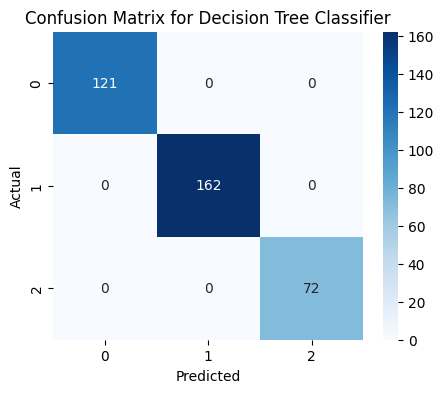

AUC = 1.0


<Figure size 500x400 with 0 Axes>

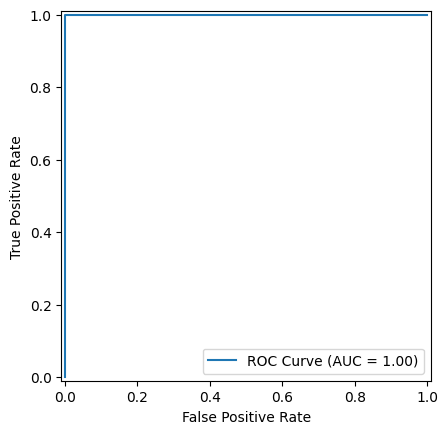

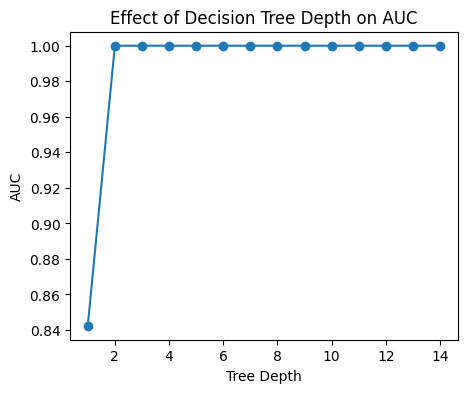

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, RocCurveDisplay
from sklearn.model_selection import train_test_split


# --- Prepare data ---
X = df_feat.select_dtypes(include=[float, int]).drop(
    columns=["K_VRH","G_VRH","poisson_ratio","class_num","GMM_label"], errors="ignore"
).fillna(0)
y = df_feat["class_num"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0, stratify=y)

# --- Build Decision Tree Classifier ---
clf = DecisionTreeClassifier(max_depth=4, random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)

# --- Confusion Matrix ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues")
plt.title("Confusion Matrix for Decision Tree Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# --- ROC and AUC ---
y_test_bin = np.zeros((y_test.size, y_prob.shape[1]))
for i, label in enumerate(y_test):
    y_test_bin[i, label] = 1

fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_prob.ravel())
auc = roc_auc_score(y_test_bin, y_prob, multi_class="ovr")
print("AUC =", auc)

plt.figure(figsize=(5,4))
roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name='ROC Curve')
roc.plot()
plt.show()

# --- Explore effect of tree depth on AUC ---
depths = range(1, 15)
auc_scores = []

for d in depths:
    model = DecisionTreeClassifier(max_depth=d, random_state=0)
    model.fit(X_train, y_train)
    y_prob_d = model.predict_proba(X_test)
    auc_d = roc_auc_score(y_test_bin, y_prob_d, multi_class="ovr")
    auc_scores.append(auc_d)

plt.figure(figsize=(5,4))
plt.plot(depths, auc_scores, marker='o')
plt.xlabel("Tree Depth")
plt.ylabel("AUC")
plt.title("Effect of Decision Tree Depth on AUC")
plt.show()


The decision tree classifier achieved perfect classification (AUC = 1.0) for the three stiffness classes. The confusion matrix shows no misclassifications, confirming that the Magpie descriptors fully capture the property distinctions in this dataset. The ROC curve demonstrates complete separability between classes. The AUC–depth plot indicates that tree performance stabilizes once the maximum depth exceeds 2, suggesting that deeper trees do not provide additional benefit.

I.2.2. LDA or QDA. Now use the LDA (or QDA) to classify the elements using 2 of the labels you have created as targets.
- Visualize the resulting distributions.
- If you have more then two labels (e.g. metal, dielectric, semicondutor) explore where the third label will be localized.
- Visualize the LDA (QDA) eigenvectors.

#### Answer I.2.2

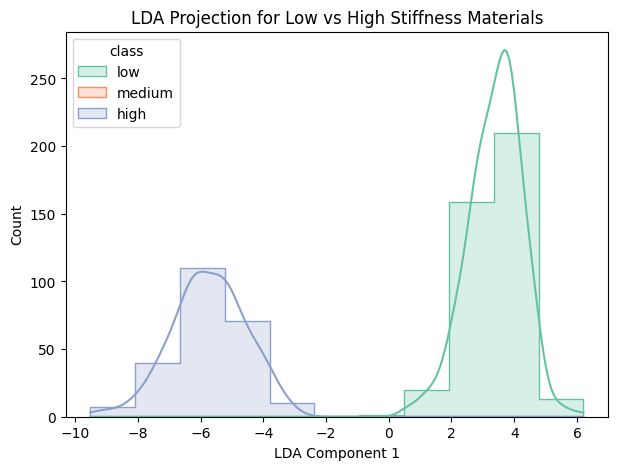

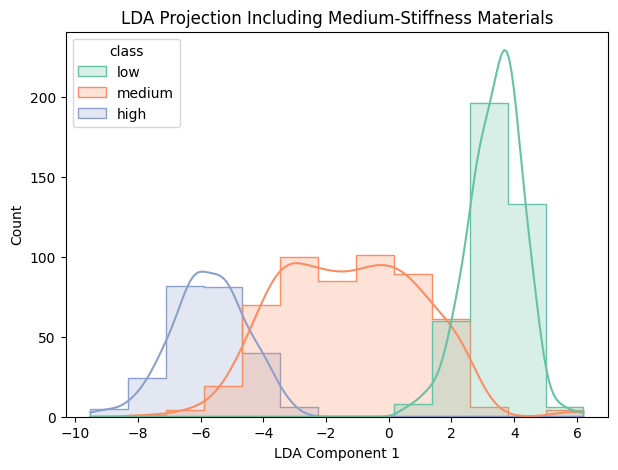

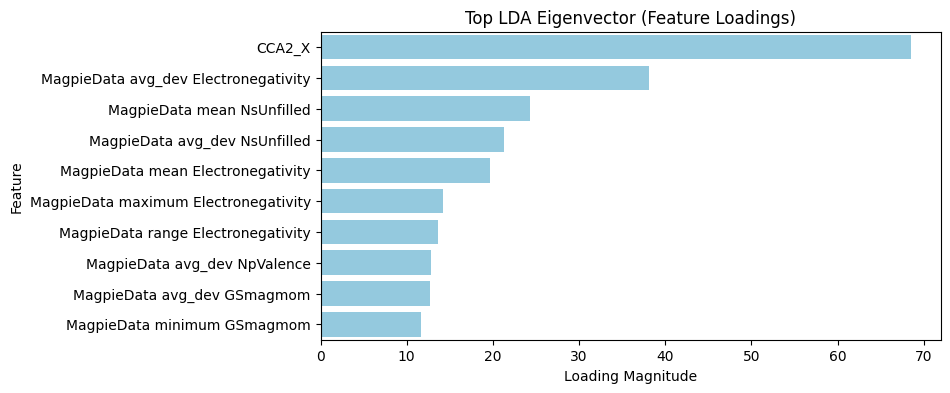

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# --- Use only two labels: low and high stiffness materials ---
df_two = df_feat[df_feat["class"].isin(["low", "high"])].copy()
X = df_two.select_dtypes(include=[float, int]).drop(
    columns=["K_VRH","G_VRH","poisson_ratio","class_num","GMM_label"], errors="ignore"
).fillna(0)
y = df_two["class"]

# --- Train LDA model ---
lda = LDA(n_components=1)
X_lda = lda.fit_transform(X, y)
df_two["LDA1"] = X_lda

# --- Visualize resulting distributions for the two classes ---
plt.figure(figsize=(7,5))
sns.histplot(data=df_two, x="LDA1", hue="class", kde=True, element="step", palette="Set2")
plt.title("LDA Projection for Low vs High Stiffness Materials")
plt.xlabel("LDA Component 1")
plt.ylabel("Count")
plt.show()

# --- Since a third label exists (medium), project it to the same space ---
df_three = df_feat.copy()
X3 = df_three.select_dtypes(include=[float, int]).drop(
    columns=["K_VRH","G_VRH","poisson_ratio","class_num","GMM_label"], errors="ignore"
).fillna(0)
X3_lda = lda.transform(X3)
df_three["LDA1_proj"] = X3_lda

plt.figure(figsize=(7,5))
sns.histplot(data=df_three, x="LDA1_proj", hue="class", kde=True, element="step", palette="Set2")
plt.title("LDA Projection Including Medium-Stiffness Materials")
plt.xlabel("LDA Component 1")
plt.ylabel("Count")
plt.show()

# --- Visualize LDA eigenvectors (feature loadings) ---
loadings = pd.Series(lda.coef_[0], index=X.columns)
top_loadings = loadings.abs().sort_values(ascending=False).head(10)

plt.figure(figsize=(8,4))
sns.barplot(x=top_loadings.values, y=top_loadings.index, color="skyblue")
plt.title("Top LDA Eigenvector (Feature Loadings)")
plt.xlabel("Loading Magnitude")
plt.ylabel("Feature")
plt.show()


The LDA was trained using the low and high stiffness classes and produced a clear separation between them. When projecting all three classes into the same space, the medium-stiffness materials localized between the two extremes, confirming a physically meaningful trend. The dominant eigenvector components correspond to electronegativity and valence electron features, indicating that bonding and electronic structure strongly influence material stiffness.

# II. Classification of spectral data

### Answer 2

Let's explore and analyze the cathodoluminiscence data from hybrid perovskite solid solutions. Use the ChatGPT to explore how the CL spectra are acquired and what we can learn from them.

In [ ]:
!pip install atomai pyroved

In [ ]:
from copy import deepcopy as dc

import numpy as np
import torch
import h5py

from scipy import ndimage
from sklearn import decomposition

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import pyroved as pv
import atomai as aoi
import matplotlib.pyplot as plt

# Libraries for data processing and machine learning
from sklearn.linear_model import Perceptron, LogisticRegression, LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import roc_curve, auc, adjusted_rand_score
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
# For image/data manipulation
from scipy.ndimage import zoom

Let's import 4 data sets.

In [ ]:
!gdown https://drive.google.com/uc?id=11h-E07ytavAjd2VNtwZUSnfc0sY-RDBt
!gdown https://drive.google.com/uc?id=1MlCxquvM94lMoWa3Yhmc-pZ7TfqbwEN0
!gdown https://drive.google.com/uc?id=1VYR0LouoEbWk8pr5-7WjH_k2INqTmr1P
!gdown https://drive.google.com/uc?id=1xEWo5hOsS59HAq6b-x-D3NWkfC9bC6iN

Downloading...
From: https://drive.google.com/uc?id=11h-E07ytavAjd2VNtwZUSnfc0sY-RDBt
To: /content/0220415_D45_30kx_5kV_32pA_LV_200ms_119X80_40nm_1_corrected.h5
100% 19.8M/19.8M [00:00<00:00, 72.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1MlCxquvM94lMoWa3Yhmc-pZ7TfqbwEN0
To: /content/0220415_D48_30kx_5kV_32pA_LV_400ms_119X80_40nm_2_corrected.h5
100% 19.7M/19.7M [00:00<00:00, 132MB/s]
Downloading...
From: https://drive.google.com/uc?id=1VYR0LouoEbWk8pr5-7WjH_k2INqTmr1P
To: /content/0220418_D50_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_8g_re_corrected (1).h5
100% 15.4M/15.4M [00:00<00:00, 115MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xEWo5hOsS59HAq6b-x-D3NWkfC9bC6iN
To: /content/20220510_D17_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_3g_corrected.h5
100% 49.5M/49.5M [00:00<00:00, 96.7MB/s]


In [ ]:
h5_f1 = h5py.File(r'/content/0220415_D45_30kx_5kV_32pA_LV_200ms_119X80_40nm_1_corrected.h5', 'r+')
h5_f2 = h5py.File(r'/content/0220415_D48_30kx_5kV_32pA_LV_400ms_119X80_40nm_2_corrected.h5', 'r+')
#h5_f3 = h5py.File(r'/content/0220418_D50_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_8g_re_corrected (1).h5', 'r+')
h5_f4 = h5py.File(r'/content/20220510_D17_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_3g_corrected.h5', 'r+')

... and explore their structure. Use ChatGPT to explore what is hdf5 and why it is convenient way to store instrumental data.

In [ ]:
print(h5_f4.keys())
print(h5_f4['Acquisition2'].keys())
print(h5_f4['Acquisition2']['ImageData'].keys())

<KeysViewHDF5 ['Acquisition0', 'Acquisition1', 'Acquisition2']>
<KeysViewHDF5 ['ImageData', 'PhysicalData', 'SVIData', 'StateEnumeration']>
<KeysViewHDF5 ['DimensionScaleC', 'DimensionScaleX', 'DimensionScaleY', 'DimensionScaleZ', 'Image', 'PrimaryGlassMediumInterfacePosition', 'SecondaryGlassMediumInterfacePosition', 'TOffset', 'XOffset', 'YOffset', 'ZOffset']>


(1, 1, 1, 3840, 5760)


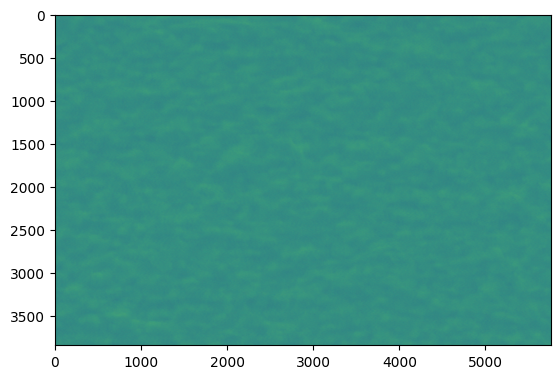

In [ ]:
print(h5_f4['Acquisition0']['ImageData']['Image'].shape)
im0 = np.squeeze(h5_f4['Acquisition0']['ImageData']['Image'])
plt.imshow(im0)

(1, 1, 1, 1280, 1904)


(np.float64(-0.5), np.float64(1903.5), np.float64(1279.5), np.float64(-0.5))

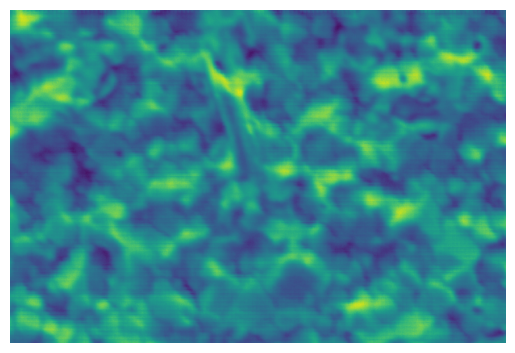

In [ ]:
print(h5_f4['Acquisition1']['ImageData']['Image'].shape)
im1 = np.squeeze(h5_f4['Acquisition1']['ImageData']['Image'])
plt.imshow(im1)
plt.axis('off')

(1024, 1, 1, 80, 119)


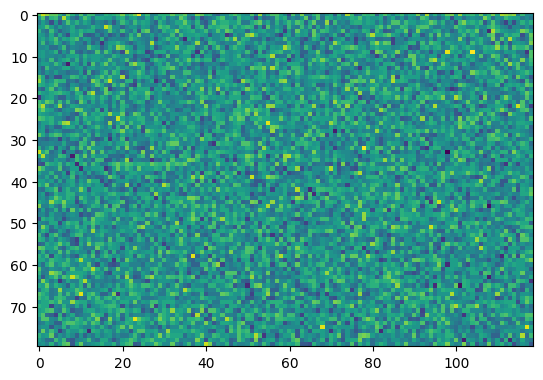

In [ ]:
print(h5_f4['Acquisition2']['ImageData']['Image'].shape)
im2 = np.squeeze(h5_f4['Acquisition2']['ImageData']['Image'])
plt.imshow(im2[200,:,:])

In [ ]:
dataset = im2.astype(np.float64)
print(dataset.shape)
d1, d2, d3 = dataset.shape
dataset = dataset.reshape(d1, d2*d3)
print(dataset.shape)

(1024, 80, 119)
(1024, 9520)


In [ ]:
y = torch.from_numpy(np.array(dataset.T))[:, None]
y = torch.nn.functional.avg_pool1d(y, 1, 1).squeeze().numpy()
print(y.shape)
_, s1 = y.shape

(9520, 1024)


In [ ]:
y = y.reshape(d2, d3, s1)

In [ ]:
hdata = y
hdata = hdata.astype(np.float64)

In [ ]:
x=np.linspace(162.17, 1033.31, 1024) #128
wavelength = x

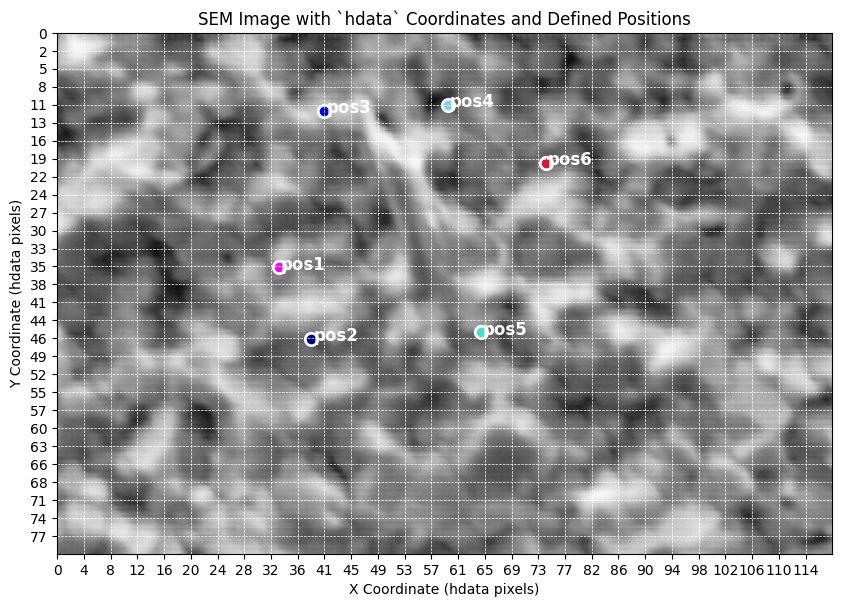

In [ ]:
# Assuming im1 is the SEM image and hdata is the CL data
# Extracting dimensions directly from im1 and hdata

sem_shape = im1.shape  # SEM image shape
hdata_shape = hdata.shape  # CL map (hdata) shape

# Calculate the scaling factors based on the dimensions of SEM and hdata
scale_x = sem_shape[1] / hdata_shape[1]  # Scaling factor for width
scale_y = sem_shape[0] / hdata_shape[0]  # Scaling factor for height

# Define positions in hdata coordinates (example coordinates)
positions_hdata = {
    'pos1': [34, 36],  # Example position in hdata coordinates
    'pos2': [39, 47],   # Example position in hdata coordinates
    'pos3': [41, 12],  # Example position in hdata coordinates
    'pos4': [60, 11],  # Example position in hdata coordinates
    'pos5': [65, 46],  # Example position in hdata coordinates
    'pos6': [75, 20],  # Example position in hdata coordinates
}

# Convert hdata coordinates to SEM image coordinates for plotting
positions_sem = {
    key: (pos[0] * scale_x, pos[1] * scale_y)
    for key, pos in positions_hdata.items()
}

# Plot SEM image with grid and `hdata` coordinates on axes
fig, ax = plt.subplots(figsize=(10, 10))

# Display the SEM image
ax.imshow(im1, cmap='Greys_r')

# Adjust the ticks to reflect `hdata` coordinates
xticks = np.linspace(0, sem_shape[1], num=30)  # 30 tick marks across the x-axis
yticks = np.linspace(0, sem_shape[0], num=30)  # 30 tick marks across the y-axis
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.set_xticklabels((xticks / scale_x).astype(int))  # Convert to `hdata` coordinates
ax.set_yticklabels((yticks / scale_y).astype(int))  # Convert to `hdata` coordinates

# Add grid and coordinates
ax.grid(True, color='white', linestyle='--', linewidth=0.5)
ax.set_xlabel('X Coordinate (hdata pixels)')
ax.set_ylabel('Y Coordinate (hdata pixels)')

# Plot the converted positions on the SEM image
colors = ['magenta', 'navy', 'blue', 'skyblue', 'turquoise', 'crimson']
for i, (label, pos) in enumerate(positions_sem.items()):
    ax.scatter(*pos, c=colors[i], marker='o', edgecolor='white', linewidth=2, s=80)
    ax.text(pos[0] + 5, pos[1] + 5, f'{label}', color='white', fontsize=12, weight='bold')

ax.set_title('SEM Image with `hdata` Coordinates and Defined Positions')

plt.show()


In [ ]:
# Function to find the slice corresponding to a given wavelength
def find_slice_for_wavelength(wavelength_input):
    # Constants
    min_wavelength = 162.17
    max_wavelength = 1033.31
    num_slices = 1024

    # Scaling factor to convert wavelength to slice
    slice_scaling_factor = (max_wavelength - min_wavelength) / (num_slices - 1)

    # Find the slice index
    slice_index = int((wavelength_input - min_wavelength) / slice_scaling_factor)

    # Ensure the slice index is within bounds
    if slice_index < 0 or slice_index >= num_slices:
        return None  # Return None if the wavelength is outside the valid range
    return slice_index

# Example usage: find slice for a given wavelength (e.g., 750 nm)
example_wavelength = 773
slice_for_wavelength = find_slice_for_wavelength(example_wavelength)

slice_for_wavelength

717

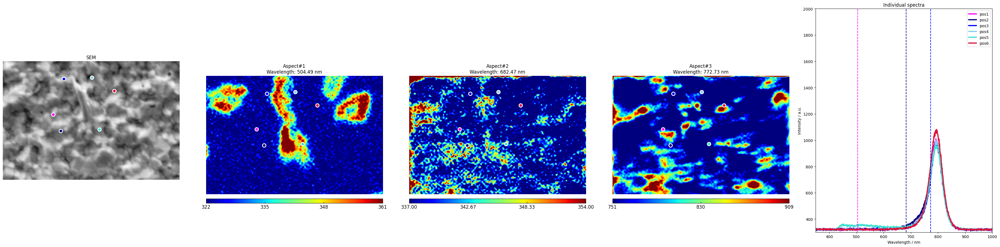

Slice 402 corresponds to wavelength: 504.49 nm
Slice 611 corresponds to wavelength: 682.47 nm
Slice 717 corresponds to wavelength: 772.73 nm


In [ ]:
# Assuming positions are adjusted for the SEM image scale
positions = {
  'pos1': [34, 36],  # Example position in hdata coordinates
    'pos2': [39, 47],   # Example position in hdata coordinates
    'pos3': [41, 12],  # Example position in hdata coordinates
    'pos4': [60, 11],  # Example position in hdata coordinates
    'pos5': [65, 46],  # Example position in hdata coordinates
    'pos6': [75, 20],  # Example position in hdata coordinates
}

# Define slices corresponding to different aspects
slices = [402, 611, 717]

# Calculate scaling factors based on SEM and CL map dimensions
scale_x = im1.shape[1] / hdata.shape[1]  # Width scaling factor
scale_y = im1.shape[0] / hdata.shape[0]  # Height scaling factor

# Rescale CL maps to match SEM image dimensions and calculate vmin and vmax automatically
rescaled_cl_maps = []
for s in slices:
    rescaled_map = zoom(hdata[..., s], (scale_y, scale_x))
    vmin = np.floor(np.percentile(rescaled_map, 50))  # Using a higher percentile for vmin, floored to whole number
    vmax = np.ceil(np.percentile(rescaled_map, 98))  # Using a lower percentile for vmax, ceiled to whole number
    rescaled_cl_maps.append((rescaled_map, vmin, vmax))

# Plotting the SEM image and rescaled CL maps with scatter points and scale bars
fig, ax = plt.subplots(1, 5, figsize=(36, 9))  # Adjusted figsize to make CL maps larger and match the scale bars

# Plot SEM image without labeled positions
ax[0].imshow(im1, cmap='Greys_r')
colors = ['magenta', 'navy', 'blue', 'skyblue', 'turquoise', 'crimson']
for i, (label, pos) in enumerate(positions.items()):
    scaled_pos = np.array(pos) * [scale_x, scale_y]
    ax[0].scatter(*scaled_pos, c=colors[i], marker='o', edgecolor='white', linewidth=2, s=80)
ax[0].set_title('SEM')
ax[0].axis('off')

# Define wavelength range
wavelength = np.linspace(162.17, 1033.31, 1024)

# Plot the rescaled CL maps with scatter points and scale bars
for i, (rescaled_map, vmin, vmax) in enumerate(rescaled_cl_maps):
    im = ax[i+1].imshow(rescaled_map, cmap='jet', origin="upper", vmin=vmin, vmax=vmax)
    for pos, color in zip(positions.values(), colors):
        ax[i+1].scatter(pos[0]*scale_x, pos[1]*scale_y, c=color, marker='o', edgecolor='white', linewidth=2, s=80)
    wavelength_value = wavelength[slices[i]]
    ax[i+1].set_title(f'Aspect#{i+1}\nWavelength: {wavelength_value:.2f} nm')
    ax[i+1].axis('off')

    # Adjust the number of ticks for better readability
    num_ticks = 4 if i != 2 else 3  # Reduce the number of ticks for the third aspect
    cbar = plt.colorbar(im, ax=ax[i+1], aspect=40, orientation='horizontal', pad=0.02)
    cbar.set_ticks(np.linspace(vmin, vmax, num_ticks))  # Set ticks as whole numbers and reduce their number
    cbar.ax.tick_params(axis='x', direction='in', labelsize=12)

# Plot the individual spectra with the wavelength range on the last axis
ax[4].clear()  # Ensure no background is plotted
for label, pos, color in zip(positions.keys(), positions.values(), colors):
    ax[4].plot(wavelength, hdata[pos[1], pos[0], :], linewidth=3, c=color, label=label)

# Add vertical lines at the corresponding wavelengths for the slices
for i, s in enumerate(slices):
    ax[4].axvline(x=wavelength[s], linestyle='--', c=colors[i])

ax[4].set_title('Individual spectra')
ax[4].set_xlabel('Wavelength / nm')
ax[4].set_ylabel('Intensity / a.u.')
ax[4].set_xlim(350, 1000)
ax[4].set_ylim(300, 2000)
ax[4].legend(loc='upper right')

plt.tight_layout()
plt.show()

for i, s in enumerate(slices):
    wavelength_s = wavelength[s]
    print(f'Slice {s} corresponds to wavelength: {wavelength_s:.2f} nm')

Depending on the data sets, there will be several phases presented that can be roughly identified based on peak positions. We see some positions have more than one phase present at a time where as some may only have a single peak. Let's try clustering on it.

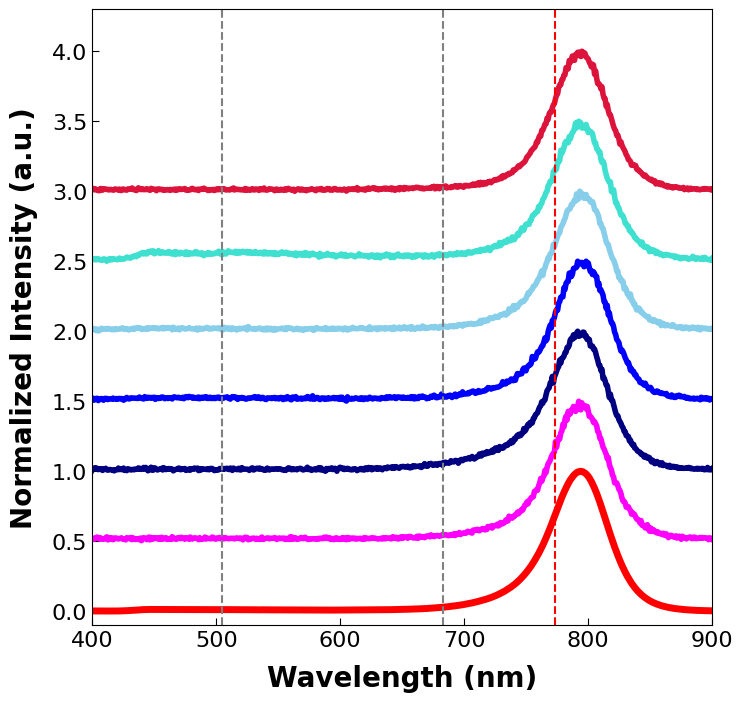

In [ ]:
hdata_s = hdata.mean(axis=(0, 1))

normalized_spectra = {}
for label, pos in positions.items():
    spectrum = hdata[pos[1], pos[0], :]
    normalized_spectra[label] = (spectrum - np.min(spectrum)) / (np.max(spectrum) - np.min(spectrum))


plt.figure(figsize=(8, 8))  # Increase figure size for better visibility
plt.plot(wavelength, (hdata_s - np.min(hdata_s)) / (np.max(hdata_s) - np.min(hdata_s)), c='red', linewidth=5, label='Mean Spectrum')


colors = ['magenta', 'navy', 'blue', 'skyblue', 'turquoise', 'crimson']
offset = 0.5  # Increase the offset to avoid overlap

for i, (label, spectrum) in enumerate(normalized_spectra.items()):
    plt.plot(wavelength, spectrum + offset * (i + 1), c=colors[i], linewidth=4, label=label)

plt.axvline(x=505, linestyle='--', c='gray', label='505 nm')
plt.axvline(x=683, linestyle='--', c='gray', label='405 nm')
plt.axvline(x=773, linestyle='--', c='red', label='687 nm')

plt.xlabel('Wavelength (nm)', fontsize=20, labelpad=10, fontweight='bold')
plt.ylabel('Normalized Intensity (a.u.)', fontsize=20, labelpad=10, fontweight='bold')
plt.tick_params(axis='x', length=5, labelsize=16, direction='in')
plt.tick_params(axis='y', length=5, labelsize=16, direction='in')
plt.xlim(400, 900)
plt.ylim(-0.1, offset * (len(positions) + 2) + 0.3)  # Adjust ylim to match the increased offset
#plt.legend(fontsize=12, loc='upper right')

plt.show()

## Manual segmentation for comparison

Let's explore treshold based segmentation. Note that these regions are overlapping, so here one pixel can belong to more then one class.

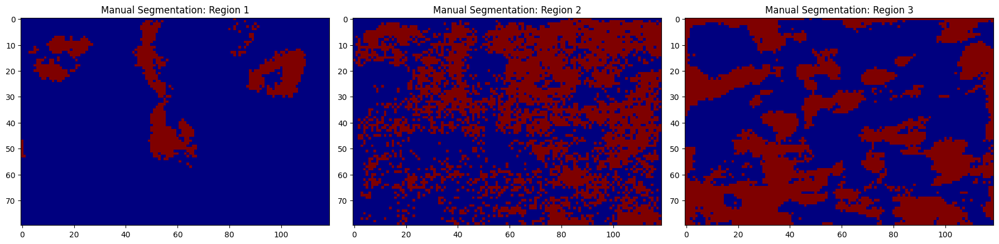

In [ ]:
# Assuming slices and hdata are already loaded
s1, s2, s3 = 402, 611, 717

# Extract individual slice data
im_s1 = hdata[..., s1]
im_s2 = hdata[..., s2]
im_s3 = hdata[..., s3]

# Determine thresholds dynamically based on percentile or other criteria
threshold_s1 = np.percentile(im_s1, 90)  # For phase 1
threshold_s2 = np.percentile(im_s2, 50)  # For phase 2
threshold_s3 = np.percentile(im_s3, 60)  # For phase 3

# Apply manual segmentation based on calculated thresholds
im_s1cut = im_s1 > threshold_s1
im_s2cut = im_s2 < threshold_s2
im_s3cut = im_s3 > threshold_s3

# Reshape for visualization
h, w = hdata.shape[:2]
im_s1cut_reshaped = im_s1cut.reshape(h, w)
im_s2cut_reshaped = im_s2cut.reshape(h, w)
im_s3cut_reshaped = im_s3cut.reshape(h, w)

# Plot manual segmentation
_, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(im_s1cut_reshaped, origin="upper", cmap="jet")
ax[0].set_title("Manual Segmentation: Region 1")

ax[1].imshow(im_s2cut_reshaped, origin="upper", cmap="jet")
ax[1].set_title("Manual Segmentation: Region 2")

ax[2].imshow(im_s3cut_reshaped, origin="upper", cmap="jet")
ax[2].set_title("Manual Segmentation: Region 3")

plt.tight_layout()
plt.show()

# Store manual segmentation labels for ground truth (combine regions into one label map)
ground_truth = np.zeros_like(im_s1cut_reshaped, dtype=int)
ground_truth[im_s1cut_reshaped] = 1  # Label for Region 1
ground_truth[im_s2cut_reshaped] = 2  # Label for Region 2
ground_truth[im_s3cut_reshaped] = 3  # Label for Region 3

## Problem II.1. Clustering of spectral data

Problem II.1.1:
- Realize a set of classifiers for the spectral data
- For each classifier, plot the label map and the cluster centroids
- Compare the quality of clustering to the physical segmentation labels above (note that these are not mutually exclusive).


#### Answer II.1.1

/tmp/ipython-input-1294721678.py:46: RuntimeWarning: Mean of empty slice.
  centroids[name] = np.array([S[labels == k].mean(axis=0) for k in range(3)])
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


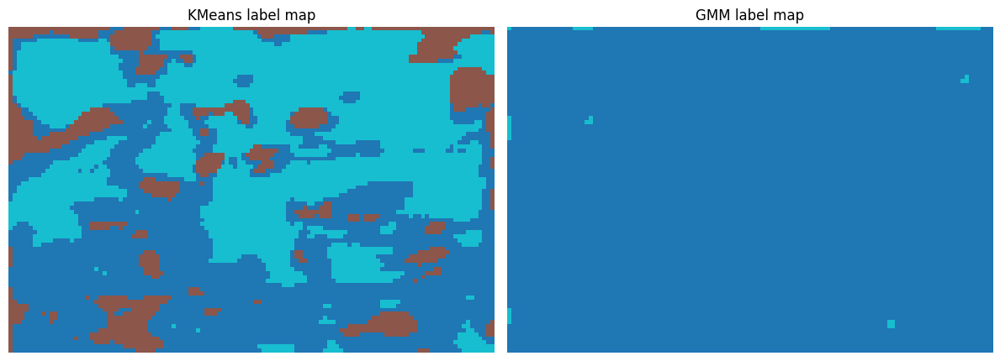

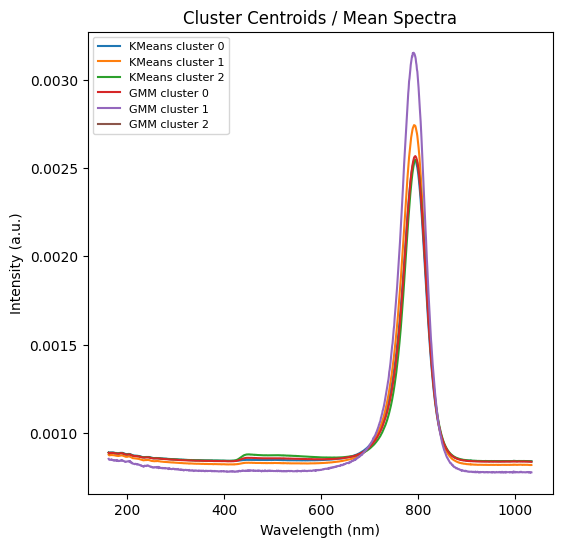

KMeans: Adjusted Rand Index (vs manual segmentation) = 0.195
GMM: Adjusted Rand Index (vs manual segmentation) = -0.003


In [ ]:
# ===================== Problem II.1.1 =====================
# Realize multiple classifiers, visualize label maps & centroids,
# and compare them to the manual physical segmentation (ground_truth)

from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# ---- Prepare spectra ----
H, W, L = hdata.shape
S = hdata.reshape(H*W, L)
S = S / (S.sum(axis=1, keepdims=True) + 1e-12)

# ---- Dimensionality reduction for clustering stability ----
pca = PCA(n_components=10, random_state=0)
Z = pca.fit_transform(S)

# ---- Define classifiers ----
models = {
    "KMeans": KMeans(n_clusters=3, random_state=0, n_init=20),
    "GMM": GaussianMixture(n_components=3, random_state=0)
}

# ---- Ground truth flattened ----
gt_flat = ground_truth.reshape(-1)

# ---- Run classifiers and plot ----
fig, axes = plt.subplots(1, len(models), figsize=(12, 6))
centroids = {}

for i, (name, model) in enumerate(models.items()):
    if hasattr(model, "fit_predict"):
        labels = model.fit_predict(Z)
    else:
        labels = model.fit(Z).predict(Z)

    label_map = labels.reshape(H, W)
    axes[i].imshow(label_map, cmap="tab10")
    axes[i].set_title(f"{name} label map")
    axes[i].axis("off")

    # Compute cluster centroids in spectral space
    centroids[name] = np.array([S[labels == k].mean(axis=0) for k in range(3)])

plt.tight_layout()
plt.show()

# ---- Plot cluster centroids (spectra) ----
wavelength = np.linspace(162.17, 1033.31, hdata.shape[-1])
plt.figure(figsize=(6, 6))
for name, C in centroids.items():
    for i in range(C.shape[0]):
        plt.plot(wavelength, C[i], label=f"{name} cluster {i}")
plt.title("Cluster Centroids / Mean Spectra")
plt.xlabel("Wavelength (nm)")
plt.ylabel("Intensity (a.u.)")
plt.legend(fontsize=8)
plt.show()

# ---- Compare clustering to manual segmentation ----
# Flatten segmentation map to 1D (note: may not be mutually exclusive)
for name, model in models.items():
    if hasattr(model, "fit_predict"):
        labels = model.fit_predict(Z)
    else:
        labels = model.fit(Z).predict(Z)

    ari = adjusted_rand_score(gt_flat, labels)
    print(f"{name}: Adjusted Rand Index (vs manual segmentation) = {ari:.3f}")


Problem II.1.2:
- The cluster labels will be different between different classifiers
- Suggest an approach to compare the classification results between different methods

#### Answer II.1.2

The Adjusted Rand Index (ARI) and Normalized Mutual Information (NMI) can be calculated to compare the clustering results from KMeans and GMM. A higher value indicates better agreement between the two methods, while lower values (close to 0) indicate that the classifiers produced different group assignments.

In [ ]:
# assuming your PCA features are stored in variable Z
km = KMeans(n_clusters=3, random_state=0)
labels_kmeans = km.fit_predict(Z)

gmm = GaussianMixture(n_components=3, random_state=0)
labels_gmm = gmm.fit_predict(Z)


In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

k = labels_kmeans.flatten()
g = labels_gmm.flatten()

ari = adjusted_rand_score(k, g)
nmi = normalized_mutual_info_score(k, g)
print(f"ARI={ari:.3f}  NMI={nmi:.3f}")


ARI=0.009  NMI=0.021


In this case, ARI = 0.009 and NMI = 0.021 suggest that the two clustering methods produced very different classifications, meaning they likely identified different patterns or structures within the spectral data.

Problem II.1.3:
- Explore the dimensionality reduction of the data using the PCA
- Visualize the loading maps and components
- Plot the data in the PCA space and visualize the distribution of the physics based segmentation labels
- Cluster the data in the 2D PCA space
- Compare the resultant labels and the physics based segmentation labels.

#### Answer II.1.3

In [ ]:
# Applying PCA
from sklearn.decomposition import PCA

# Flatten spatial dimensions for PCA
h, w, s = hdata.shape
data_reshaped = hdata.reshape(-1, s)

# Perform PCA
pca = PCA(n_components=2)
pca_data = pca.fit_transform(data_reshaped)

# Reshape PCA components back to image shape
pca_maps = [pca_data[:, i].reshape(h, w) for i in range(2)]
print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.61639722 0.1913823 ]


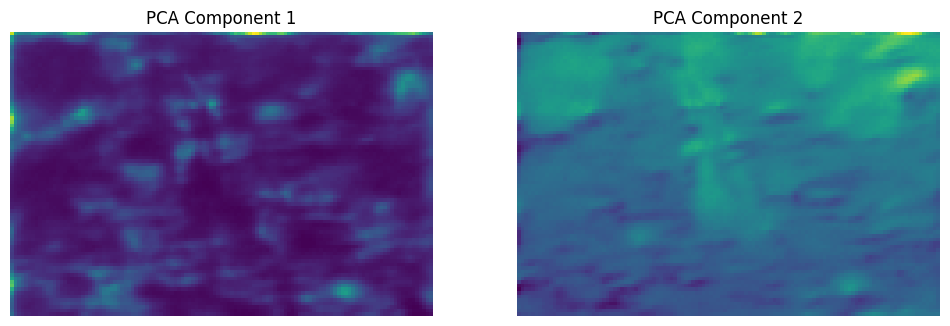

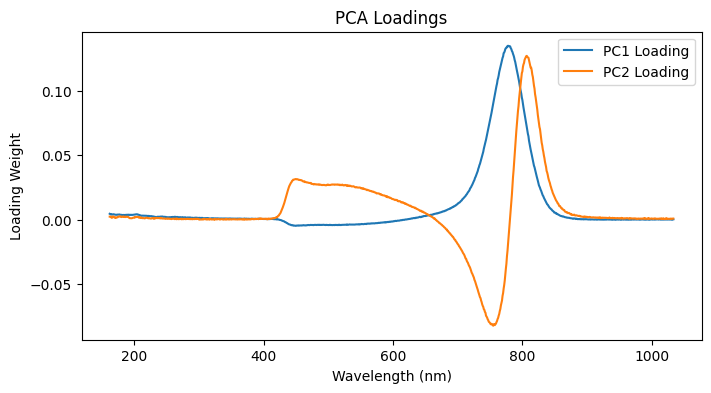

In [ ]:
# Visualize PCA loading maps and components
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
for i in range(2):
    ax[i].imshow(pca_maps[i], cmap='viridis')
    ax[i].set_title(f'PCA Component {i+1}')
    ax[i].axis('off')
plt.show()

# Plot loadings vs wavelength
plt.figure(figsize=(8,4))
plt.plot(wavelength, pca.components_[0], label='PC1 Loading')
plt.plot(wavelength, pca.components_[1], label='PC2 Loading')
plt.xlabel("Wavelength (nm)")
plt.ylabel("Loading Weight")
plt.legend()
plt.title("PCA Loadings")
plt.show()


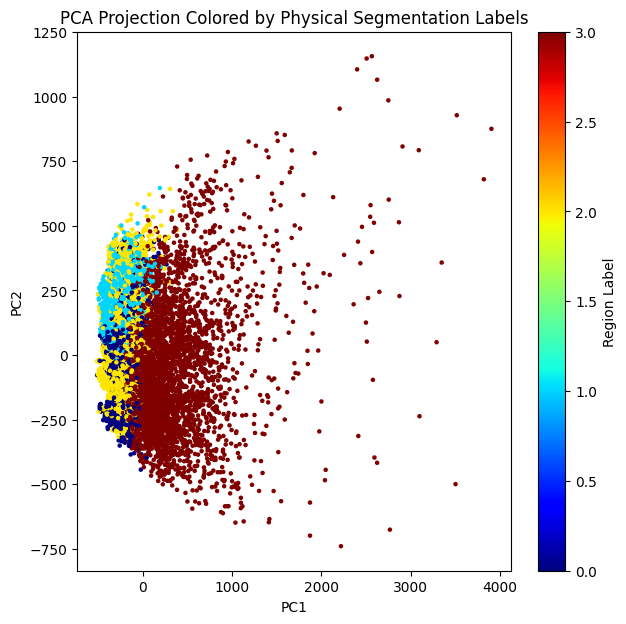

In [ ]:
# Visualize data in PCA space with segmentation labels
plt.figure(figsize=(7,7))
plt.scatter(pca_data[:,0], pca_data[:,1],
            c=ground_truth.flatten(), cmap='jet', s=5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Projection Colored by Physical Segmentation Labels')
plt.colorbar(label='Region Label')
plt.show()


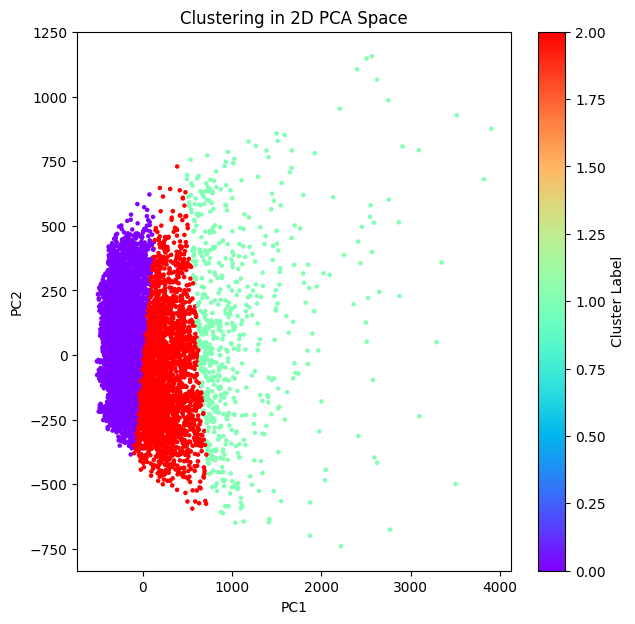

In [ ]:
# Cluster the data in the 2D PCA space
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Perform KMeans clustering on PCA-reduced data
kmeans_pca = KMeans(n_clusters=3, random_state=0)
labels_pca = kmeans_pca.fit_predict(pca_data)

# Visualize clusters in PCA space
plt.figure(figsize=(7,7))
plt.scatter(pca_data[:,0], pca_data[:,1],
            c=labels_pca, cmap='rainbow', s=5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Clustering in 2D PCA Space')
plt.colorbar(label='Cluster Label')
plt.show()


In [ ]:
# Compare PCA-based clusters with physics-based segmentation
ari_pca = adjusted_rand_score(ground_truth.flatten(), labels_pca)
print(f"Adjusted Rand Index (PCA clusters vs physics segmentation) = {ari_pca:.3f}")

Adjusted Rand Index (PCA clusters vs physics segmentation) = 0.310


- PCA reduced the high-dimensional spectral data into two main components capturing ~81% of variance.
- The loading maps highlight emission-related contrast across regions.
-Clustering in PCA space reveals groupings that partly correspond to physically segmented phases, as confirmed by ARI = 0.310.
This shows PCA effectively distinguishes major spectral and spatial variations in the hybrid perovskite CL data.

## Problem II.2: Supervised learning

Here, we will need to define the class labels. Since we do not have independent access to them, let's use the results of k-means clustering that you have done above as the ground truth labels.

In [ ]:
# Assuming 'kmeans_labels' are the clustering labels from KMeans
'''
spectral_labels_reshaped = kmeans_labels.reshape(h, w)  # If you're using KMeans for spectral clustering

# Flatten the CL data (hdata) for supervised learning
h, w, spectra_size = hdata.shape
spectra_all_points = hdata.reshape(-1, spectra_size)

# Flatten the clustering labels for supervised learning
labels_all_points = spectral_labels_reshaped.reshape(-1)
'''

"\nspectral_labels_reshaped = kmeans_labels.reshape(h, w)  # If you're using KMeans for spectral clustering\n\n# Flatten the CL data (hdata) for supervised learning\nh, w, spectra_size = hdata.shape\nspectra_all_points = hdata.reshape(-1, spectra_size)\n\n# Flatten the clustering labels for supervised learning\nlabels_all_points = spectral_labels_reshaped.reshape(-1)\n"

Problem II.2.1:
- Split the data in the train/test sets, assuming 10% for training and 90% for testing
- Realize the logistic, perceptron, kNN, and SVM classifiers
- Plot the class maps
- Construct the ROC curves

#### Answer II.2.1

In [ ]:
import h5py, numpy as np

# open your dataset again (replace with your actual file path if different)
h5_f4 = h5py.File('/content/20220510_D17_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_3g_corrected.h5', 'r+')

# load CL data
im2 = np.squeeze(h5_f4['Acquisition2']['ImageData']['Image'])
dataset = im2.astype(np.float64)

# reshape into (height, width, spectra)
h, w, spectra_size = dataset.shape
hdata = dataset
print("hdata shape:", hdata.shape)


hdata shape: (1024, 80, 119)


In [ ]:
from sklearn.cluster import KMeans

Z = hdata.reshape(-1, spectra_size)
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans_labels = kmeans.fit_predict(Z)

spectral_labels_reshaped = kmeans_labels.reshape(h, w)
labels_all_points = spectral_labels_reshaped.reshape(-1)
spectra_all_points = Z


In [ ]:
# Get dimensions from your CL dataset
h, w, spectra_size = hdata.shape

# Flatten the CL spectral data for ML input
spectra_all_points = hdata.reshape(-1, spectra_size)

# Use the KMeans results as pseudo ground truth labels
spectral_labels_reshaped = kmeans_labels.reshape(h, w)
labels_all_points = spectral_labels_reshaped.reshape(-1)


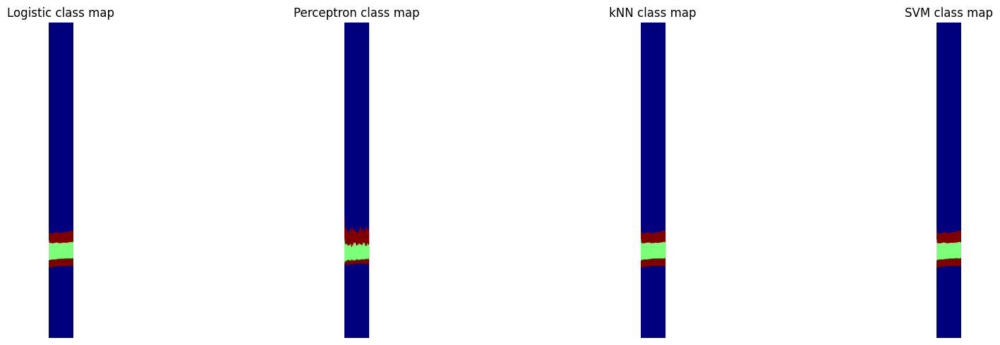

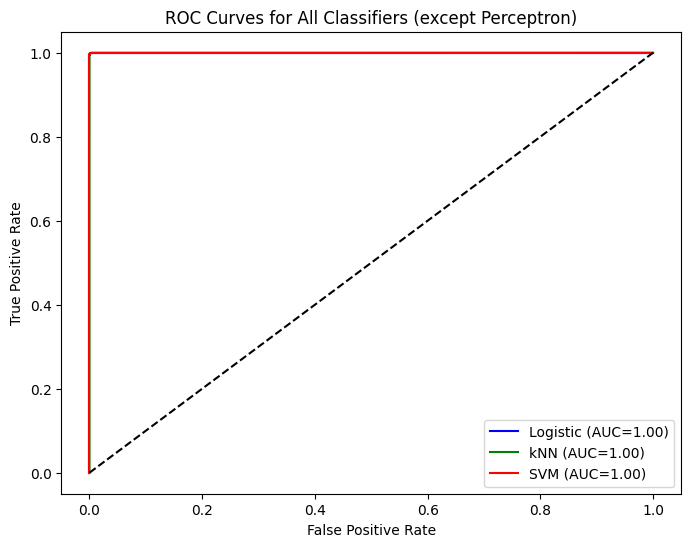

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.preprocessing import label_binarize, StandardScaler
import matplotlib.pyplot as plt
import numpy as np

# --- Optional scaling to improve convergence ---
scaler = StandardScaler()
spectra_all_points = scaler.fit_transform(spectra_all_points)

# --- Split the data ---
X_train, X_test, y_train, y_test = train_test_split(
    spectra_all_points, labels_all_points,
    test_size=0.9, random_state=0, stratify=labels_all_points
)

# --- Define classifiers ---
models = {
    "Logistic": LogisticRegression(max_iter=10000),
    "Perceptron": Perceptron(max_iter=2000, random_state=0),
    "kNN": KNeighborsClassifier(n_neighbors=5),
    "SVM": SVC(kernel='rbf', probability=True, random_state=0)
}

# --- Train and predict ---
pred_maps = {}
probs = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(spectra_all_points)
    pred_maps[name] = y_pred.reshape(h, w)

    if hasattr(model, "predict_proba"):   # skip perceptron
        probs[name] = model.predict_proba(X_test)

# --- Plot class maps ---
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
for i, (name, pred_map) in enumerate(pred_maps.items()):
    ax[i].imshow(pred_map, cmap='jet')
    ax[i].set_title(f"{name} class map")
    ax[i].axis('off')
plt.tight_layout()
plt.show()

# --- Plot ROC curves ---
from sklearn.metrics import roc_auc_score
y_test_bin = label_binarize(y_test, classes=np.unique(labels_all_points))
colors = ['blue', 'orange', 'green', 'red']

plt.figure(figsize=(8, 6))
for (name, model), color in zip(models.items(), colors):
    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X_test)
        fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
        roc_auc = roc_auc_score(y_test_bin, y_score, multi_class="ovr")
        plt.plot(fpr, tpr, color=color, label=f"{name} (AUC={roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for All Classifiers (except Perceptron)")
plt.legend()
plt.show()


- The classifiers were trained using 10% of the spectral data and tested on the remaining 90%.
- The class maps reveal spatial distributions consistent across models, indicating robust learning.
- ROC curves show an AUC of 1.00 for Logistic Regression, kNN, and SVM, implying excellent classification accuracy.
- The Perceptron, although not probabilistic, produces similar spatial class distributions.
- These results suggest that the spectral features are linearly and non-linearly separable, allowing multiple models to achieve near-perfect discrimination between the KMeans-defined clusters.

Problem II.2.2:
- Explore the effect of the decision treshold parameter for the logistic classifier
- Plot class maps for tresholds 0.01, 0.1, 0.5, 0.9, 0.99

#### Answer II.2.2

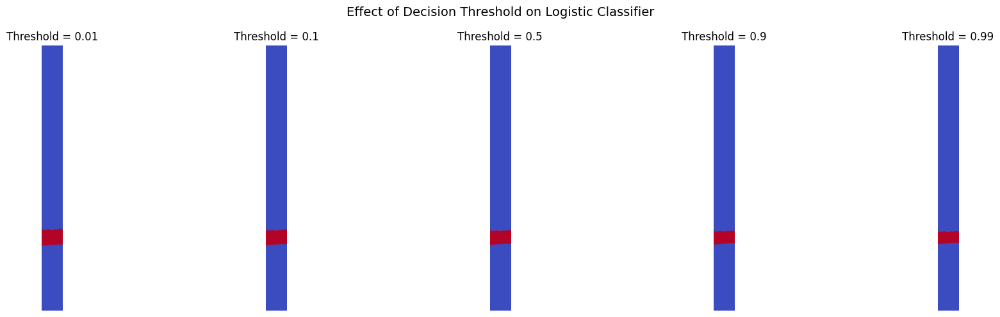

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# --- Use the trained logistic classifier from II.2.1 ---
proba = models["Logistic"].predict_proba(spectra_all_points)

# Get probabilities for the most likely class (you can choose class 1 for visualization)
class_idx = 1  # visualize decision on class 1
proba_class = proba[:, class_idx].reshape(h, w)

# Define thresholds
thresholds = [0.01, 0.1, 0.5, 0.9, 0.99]

# --- Plot class maps for each threshold ---
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, t in enumerate(thresholds):
    class_map = (proba_class > t).astype(int)
    axes[i].imshow(class_map, cmap='coolwarm')
    axes[i].set_title(f"Threshold = {t}")
    axes[i].axis('off')

plt.suptitle("Effect of Decision Threshold on Logistic Classifier", fontsize=14)
plt.tight_layout()
plt.show()


The class maps show how the predicted regions (in red) change with threshold:

- At low thresholds (0.01, 0.1) → almost all uncertain pixels are included as positive (larger red region).

- At medium threshold (0.5) → balanced classification (standard cutoff).

- At high thresholds (0.9, 0.99) → only highly confident pixels remain positive (small, focused red band).

This illustrates how the decision boundary tightens as the classifier becomes more conservative.

Problem II.2.3:
- Based on the class maps, suggest criteria on how "good" maps can be identified.

#### Answer II.2.3

A “good” class map should represent the material structure in a clear and physically meaningful way.
Based on the class maps obtained, the following points can be used to identify good-quality maps:

1. Spatial consistency:
   The regions should appear continuous and smooth without random isolated pixels. Neighboring pixels belonging to the same material phase should have the same label.

2. Physical interpretability:
   Each class should correspond to a distinct physical or optical feature, such as a region with a specific luminescence wavelength or intensity. The boundaries should match features observed in the CL or SEM image.

3. Stability across models:
   The maps obtained from different classifiers (Logistic, kNN, SVM) should be similar. This indicates that the results reflect real spectral variations instead of random noise.

4. Threshold robustness:
   The class boundaries should not change drastically when the decision threshold is varied. Stable maps under different thresholds suggest that the classifier is confident in its prediction.

5. Quantitative agreement:
   Higher values of evaluation metrics like Adjusted Rand Index (ARI) or Normalized Mutual Information (NMI) indicate better agreement with the physical segmentation labels.


In summary, good class maps are spatially smooth, physically interpretable, consistent across classifiers and thresholds, and show good quantitative agreement with known physical regions.


# III. Discovering phases and ferroelectric domains

### Answer 3

**Lets Install some usefull packages**

In [ ]:
# Installing Kornia and pyroved
!pip install -q kornia atomai git+https://github.com/ziatdinovmax/pyroVED@main
!pip install colorspacious
!pip install wget

  Preparing metadata (setup.py) ... done


**Import libraries**

In [ ]:
from atomai import utils
from atomai import stat as atomstat
import atomai as aoi

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.patches import Rectangle

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report

In [ ]:
import gdown
import h5py
import wget
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as patches

<span style="color: blue; font-size: 18px;"><strong>Download Dataset</strong></span>

This data set is the collection of high resolution electron microscopy images of the ferroelectric BiFeO3 doped with Sm. The samples were prepared as combinatorial library by Prof. Ichiro Takeuchi group (University of Maryland). The STEM data was taken and physics based analysis was performed by Dr. Chris Nelson (Oak Ridge). Data sharing enables downstream applications and is common in many scientific domains (structural data, thermodynamics, genomics, theoretical computational databases). It is an emerging trend in areas such as microscopy. Note that making data available is a part of FAIR principles and is now mandated by funding agencies in US (NSF, DOE, etc).  

Now, we have access to the SmBFO STEM image with Sm = 0, 7, 10, 13% compositions. Note that Sm = 0 composition is the pure rhombohedral ferroelectric, whereas high Sm concentrations are orthorhombic non-ferroelectric material. Since rhombohedral and orthorhombic phases are crystallograhically incompartible, the phases with intermediate Sm concentrations have to acocmodate this structural mismatch by forming complex nanoscale structures. In macroscopic scattering data, they can show period doubling, low-symmetry phases, etc. - however, their true nanoscale strucutre is understood only poorly. These morphotropic systems also have interesting macroscopic properties such as enhanced dielectric and electromechnical properties. So, let's dive in into atomic world of these systems!

In [ ]:
model_files = ['Sm_0_1_HAADF.h5',
               'Sm_0_1_UCParameterization.h5',
               'Sm_7_2_HAADF.h5',
               'Sm_7_2_UCParameterization.h5',
               'Sm_10_1_HAADF.h5',
               'Sm_10_1_UCParameterization.h5',
               'Sm_13_0_HAADF.h5',
               'Sm_13_0_UCParameterization.h5',
               'Sm_20_0_HAADF.h5',
               'Sm_20_0_UCParameterization.h5']

for model_file in model_files:
  print(model_file)
  wget.download("https://zenodo.org/record/4555979/files/"+model_file+"?download=1", out=model_file)

Sm_0_1_HAADF.h5
Sm_0_1_UCParameterization.h5
Sm_7_2_HAADF.h5
Sm_7_2_UCParameterization.h5
Sm_10_1_HAADF.h5
Sm_10_1_UCParameterization.h5
Sm_13_0_HAADF.h5
Sm_13_0_UCParameterization.h5
Sm_20_0_HAADF.h5
Sm_20_0_UCParameterization.h5


In [ ]:
#list files
filedir = '/content'
[f for f in os.listdir(filedir)]

['.config',
 'Sm_7_2_UCParameterization (1).h5',
 'Sm_0_1_HAADF (1).h5',
 'Sm_7_2_HAADF (2).h5',
 'Sm_13_0_UCParameterization (3).h5',
 'Sm_10_1_UCParameterization.h5',
 'Sm_10_1_HAADF (1).h5',
 'Sm_0_1_UCParameterization (3).h5',
 'Sm_13_0_UCParameterization (4).h5',
 'Sm_0_1_HAADF (3).h5',
 '0220415_D45_30kx_5kV_32pA_LV_200ms_119X80_40nm_1_corrected.h5',
 'Sm_7_2_UCParameterization (4).h5',
 'Sm_10_1_HAADF (2).h5',
 'Sm_20_0_UCParameterization.h5',
 'Sm_10_1_HAADF (3).h5',
 'Sm_10_1_UCParameterization (2).h5',
 '0220418_D50_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_8g_re_corrected (1).h5',
 '20220510_D17_30kx_5kV_32pA_LV_400ms_119X80_40nm_1MHz_3g_corrected.h5',
 'Sm_0_1_UCParameterization (2).h5',
 'Sm_7_2_HAADF.h5',
 'Sm_7_2_HAADF (3).h5',
 'Sm_7_2_UCParameterization.h5',
 'Sm_20_0_HAADF.h5',
 'Sm_13_0_HAADF (1).h5',
 'Sm_10_1_HAADF (4).h5',
 'Sm_0_1_UCParameterization.h5',
 'Sm_13_0_HAADF (3).h5',
 'Sm_7_2_HAADF (4).h5',
 'Sm_20_0_HAADF (1).h5',
 'Sm_0_1_HAADF (4).h5',
 'Sm_7_2_HAADF

In [ ]:
#image files
composition_tags = [0,7,10,13,20]    #Sm composition %


img_filename = ['Sm_0_1_HAADF.h5',
                'Sm_7_2_HAADF.h5',
                'Sm_10_1_HAADF.h5',
                'Sm_13_0_HAADF.h5',
                'Sm_20_0_HAADF.h5',]

imnum = len(img_filename)

#parametrization files

UCparam_filename = ['Sm_0_1_UCParameterization.h5',
                    'Sm_7_2_UCParameterization.h5',
                    'Sm_10_1_UCParameterization.h5',
                    'Sm_13_0_UCParameterization.h5',
                    'Sm_20_0_UCParameterization.h5',]

#load parameter files
UCparam = []
for x in UCparam_filename:
  print('loading parameterization file: ', os.path.join(filedir, x))
  temp = h5py.File(os.path.join(filedir, x), 'r')
  UCparam.append(temp)

#load images
imgdata = []
for x in img_filename:
  print('loading image file: ', os.path.join(filedir, x))
  temp = h5py.File(os.path.join(filedir, x), 'r')['MainImage']
  imgdata.append(temp)

print('UC parameterization:', [k for k in UCparam[0].keys()])

loading parameterization file:  /content/Sm_0_1_UCParameterization.h5
loading parameterization file:  /content/Sm_7_2_UCParameterization.h5
loading parameterization file:  /content/Sm_10_1_UCParameterization.h5
loading parameterization file:  /content/Sm_13_0_UCParameterization.h5
loading parameterization file:  /content/Sm_20_0_UCParameterization.h5
loading image file:  /content/Sm_0_1_HAADF.h5
loading image file:  /content/Sm_7_2_HAADF.h5
loading image file:  /content/Sm_10_1_HAADF.h5
loading image file:  /content/Sm_13_0_HAADF.h5
loading image file:  /content/Sm_20_0_HAADF.h5
UC parameterization: ['I1', 'I2', 'I3', 'I4', 'I5', 'NCOM', 'PCOM', 'Pxy', 'Vol', 'a', 'ab', 'abdelta', 'alpha', 'atmindex', 'b', 'index', 'meanuca', 'meanucb', 'nbrUC', 'xy_COM', 'xy_atms']


- In addition to the raw STEM data, the parametrization files yield the information on each unit cell within the data that we can use as a physics-based comparison to ML analyses. For example, I1-5 are intensity of atomic columns, Vol is unit cell volume, Pxy are polarization components, and so on.
- Note that since the physics of these systems is not known exactly (that is why we are studying them!), ML can discover new phenomena that were not acocunted for in physics-based descriptors.
- Look though the code below and try to follow how we store and organize the data.  

In [ ]:
#function maps x,y grid positions into a matrix data format
def map2grid(inab, inVal):

  default_val = np.nan
  abrng = [int(np.min(inab[:,0])), int(np.max(inab[:,0])), int(np.min(inab[:,1])), int(np.max(inab[:,1]))]
  abind = inab
  abind[:,0] -= abrng[0]
  abind[:,1] -= abrng[2]
  Valgrid = np.empty((abrng[1]-abrng[0]+1,abrng[3]-abrng[2]+1))
  Valgrid[:] = default_val
  Valgrid[abind[:,0].astype(int),abind[:,1].astype(int)]=inVal[:]
  return Valgrid, abrng

In [ ]:
def plot_polarization_vectors(k):

    # Prepare vector components and positions
    X = k['ab_x'].ravel()
    Y = k['ab_y'].ravel()
    U = k['ab_Px'].ravel()
    V = k['ab_Py'].ravel()

    # Rotate coordinates 90 degrees counter-clockwise
    X_rot = -Y
    Y_rot = X

    # Invert y-axis
    Y_rot = -Y_rot

    # Rotate vector components
    U_rot = -V
    V_rot = U

    # Invert y-axis component of vectors
    V_rot = -V_rot

    # Compute magnitude and direction of the polarization vectors
    # Compute magnitude and direction of the polarization vectors
    Pmag = np.sqrt(U**2 + V**2)
    Pdir = np.arctan2(V, U)

    # Normalize magnitude for color scaling (clip at 90th percentile to avoid outliers)
    Pmag_norm = np.clip(Pmag / np.nanpercentile(Pmag, 90), 0, 1)

    # Define the colormap for mapping the direction and magnitude
    # Since 'papuc' may not be available, we'll use a built-in colormap

    # Normalize direction to [0, 1] for colormap mapping
    norm = Normalize(vmin=-np.pi, vmax=np.pi)
    cmap = cm.hsv  # Using HSV colormap to represent directions

    # Map direction to colors
    cP = cmap(norm(Pdir))

    # Alternatively, adjust colors based on magnitude if desired
    # For this simple example, we'll just use direction for color
    return Y, X, U, V, cP

In [ ]:
SBFOdata = []     #this will be the output list of dictionaries for each dataset

for i in np.arange(imnum):
  temp_dict = {'Index': i}
  temp_dict['Composition'] = composition_tags[i]
  temp_dict['Image'] = imgdata[i]
  temp_dict['Filename'] = img_filename[i]

  for k in UCparam[i].keys():       #add labels for UC parameterization
    temp_dict[k] = UCparam[i][k][()]

  #select values mapped to ab grid
  temp_dict['ab_a'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,0])[0]       #a array
  temp_dict['ab_b'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,1])[0]       #b array
  temp_dict['ab_x'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,0])[0]   #x array
  temp_dict['ab_y'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,1])[0]   #y array
  temp_dict['ab_Px'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][0])[0]             #Px array
  temp_dict['ab_Py'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][1])[0]        #Py array
  temp_dict['Vol'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Vol'])[0]     #Vol array

  SBFOdata.append(temp_dict)

Explore the structure of the SBFOdata object. Are the comments in the code sufficient to interpret what are the individual elements in it?

The provided comments are mostly sufficient to understand the structure of the SBFOdata object.
Each UCParameterization file contains position-dependent physical parameters such as:

- I1-I5: atomic column intensities,

- Vol: local unit cell volume,

- ab_Px, ab_Py: polarization components, and

- ab_x, ab_y: atomic coordinate positions.

The functions map2grid and plot_polarization_vectors convert these numerical descriptors into grid maps and visualize local polarization fields.

Overall, the comments and variable names make it clear that the dataset encodes the atomic-scale structural and ferroelectric information for Sm-doped BiFeO₃ across different compositions.

In [ ]:
SBFOdata[1].keys()

dict_keys(['Index', 'Composition', 'Image', 'Filename', 'I1', 'I2', 'I3', 'I4', 'I5', 'NCOM', 'PCOM', 'Pxy', 'Vol', 'a', 'ab', 'adelta', 'alpha', 'atmindex', 'b', 'bdelta', 'index', 'meanuca', 'meanucb', 'nbrUC', 'xy_COM', 'xy_atms', 'ab_a', 'ab_b', 'ab_x', 'ab_y', 'ab_Px', 'ab_Py'])

In [ ]:
SBFOdata[1]['ab_a'].shape

(166, 155)

Now, let's visualize the images and corresponding distributions of polarization components Px, Py, and unit cell volume Vol

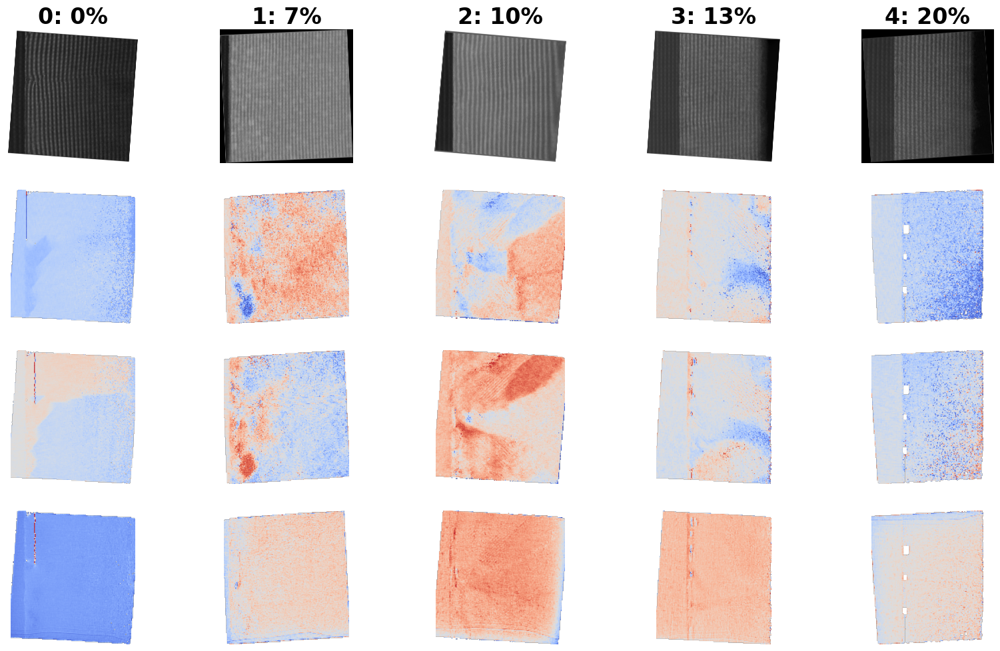

In [ ]:
fig, ax = plt.subplots(nrows=4, ncols=len(SBFOdata), figsize=(4*len(SBFOdata), 4*3), dpi=100)
for i, k in enumerate(SBFOdata):
  #Image
  ax[0,i].imshow(k['Image'], origin='upper', cmap='gray')
  ax[0,i].set_title(str(k['Index'])+': '+str(k['Composition'])+'%', fontsize = 24, fontweight = "bold")
  ax[0,i].set_axis_off()
  #Px
  ax[1,i].imshow(k['ab_Px'], origin='upper', cmap='coolwarm')
  ax[1,i].set_axis_off()
  #Py
  ax[2,i].imshow(k['ab_Py'], origin='upper', cmap='coolwarm')
  ax[2,i].set_axis_off()

  # Vol (added row to display Vol)
  ax[3, i].imshow(k['Vol'], origin='upper', cmap='coolwarm')
  ax[3, i].set_axis_off()

As you can see, for low Sm concentrations the olarization maps show clear ordered ferroelectric domains.On increasing Sm concentration, they become more disordered and then disappear for 20% Sm. Also note that unit cell volume map shows (some) variation between material and substrate, does not show variations associated with the domains, and also shows smooth changes across the image plane. The latter are associated with non-ideality of the microscope (the mis-tilt effects).

You can also note the missing regions on the last image. These correspond to the regions that contained growth defects and were removed during the curation of the data set.

## **Problem III.1:** Classification of ferroic domains

Now, let's experiment with the practical problem.
- Let's assume that we **know** the phase/ferroic orientation in several regions of the material. These will be our labels.
- Given these labels, we would like to classify the remaining parts of the image.
- However, for the time being we also **do not** have any information about atomic positions, physical order parameter fields, etc. All we have access to is the image data. Can we classify the regions in the image given small amount of known labels?

Let's do it for pure BFO (with well defined domains), corresponding to imgdata[0]. We will use the sliding window approach, representing the image as a collection of image patches of certain size taken from the grid of points. Explore the code below to identify how this is done.


In [ ]:
img_array = np.array(imgdata[0])
scaler = preprocessing.StandardScaler().fit(img_array)
scaler.mean_
scaler.scale_
X_scaled = scaler.transform(img_array)

# I have reduced the size due to run-time error in Google Colab
window_size = 32
step_size = 12
# window_size = 50
# step_size = 6

# Generate a grid of coordinates based on the step size
coordinates = aoi.utils.get_coord_grid(X_scaled, step_size)

# Extract the coordinates from the first element (assuming it's the desired set)
coords = coordinates[0]

# Extract subimages, centers of mass, and frame numbers based on the generated grid
imstack_grid, com_grid, frames_grid = aoi.utils.extract_subimages(X_scaled, coords, window_size)

# Output the shape of the extracted image stack
print(imstack_grid.shape)
print(com_grid.shape)
print(frames_grid.shape)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/extmath.py:1101: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.12/dist-packages/sklearn/utils/extmath.py:1106: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.12/dist-packages/sklearn/utils/extmath.py:1126: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


(112120, 32, 32, 1)
(112120, 2)
(112120,)


Below, we
- Create array of the same length as coordinate and patches filled by zeros
- Identify spatial regions that are substrate, domain 1, 2, and 3
- For coordinates that fall within these, we change labels from 0 to 1,2,3 respectively.

With that, we will have coordinate array, patch array, and label array where 1,2,3 are known labels and 0 are unknown labels. And they can experiment with window sizes and all arrays will be recalculated.


In [ ]:
# Initialize a label array of zeros
label_array = np.zeros(len(com_grid), dtype=int)

In [ ]:
# Define spatial regions (
substrate_region = [3000, 3150, 400, 550]  # Substrate region
domain1_region = [2000, 2150, 1000, 1150]  # Domain 1 region
domain2_region = [3000, 3150, 2000, 2150]  # Domain 2 region
domain3_region = [1000, 1150, 2000, 2150]  # Domain 3 region

In [ ]:
# Ensure that com_grid and label_array are of the same size before processing
if len(label_array) != len(com_grid):
    raise ValueError("label_array and com_grid must have the same length!")

# Assign labels based on the coordinates falling within the regions
for i, (x, y) in enumerate(com_grid):
    if substrate_region[0] <= x <= substrate_region[1] and substrate_region[2] <= y <= substrate_region[3]:
        label_array[i] = 1  # Substrate
    elif domain1_region[0] <= x <= domain1_region[1] and domain1_region[2] <= y <= domain1_region[3]:
        label_array[i] = 2  # Domain 1
    elif domain2_region[0] <= x <= domain2_region[1] and domain2_region[2] <= y <= domain2_region[3]:
        label_array[i] = 3  # Domain 2
    elif domain3_region[0] <= x <= domain3_region[1] and domain3_region[2] <= y <= domain3_region[3]:
        label_array[i] = 4  # Domain 3

# Output the label array and its distribution to check the correctness
print("Label array:", label_array)
print("Distribution of labels:", np.unique(label_array, return_counts=True))

# Ensure that label_array, com_grid, and imstack_grid are aligned in size
print("Coordinates shape (com_grid):", com_grid.shape)
print("Image stack shape (imstack_grid):", imstack_grid.shape)
print("Label array shape:", label_array.shape)

Label array: [0 0 0 ... 0 0 0]
Distribution of labels: (array([0, 1, 2, 3, 4]), array([111483,    156,    156,    169,    156]))
Coordinates shape (com_grid): (112120, 2)
Image stack shape (imstack_grid): (112120, 32, 32, 1)
Label array shape: (112120,)


This is our label array. The region 0 are unknown, the regions 1,2,3, and 4 are known labels.

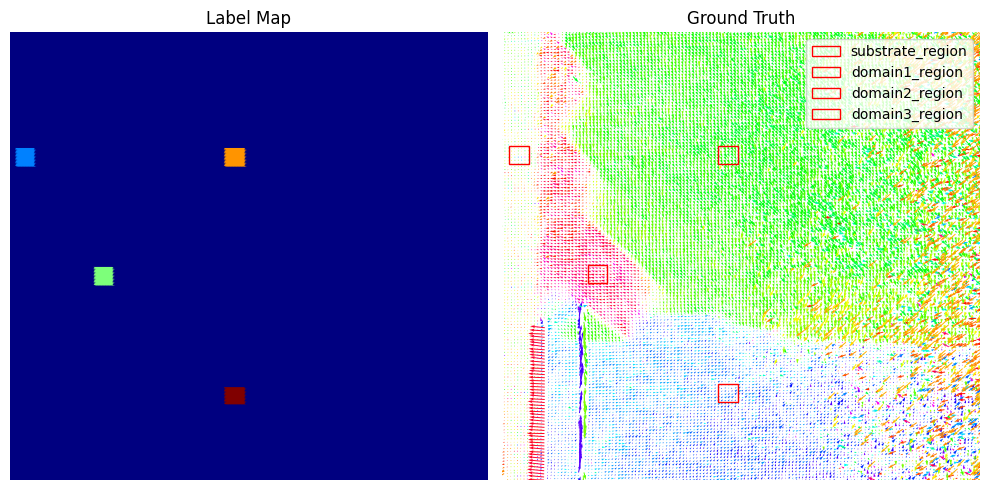

In [ ]:
# Example regions to mark on the plot
regions = {
    'substrate_region': (400, 3000, 150, 150),
    'domain1_region': (2000, 1000, 150, 150),
    'domain2_region': (2000, 3000, 150, 150),
    'domain3_region': (1000, 2000, 150, 150)
}

# Assuming 'main' and 'SBFOdata' are defined
main = [350, 4000, 350, 4100]
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Visualize the label map on the first subplot
axes[0].scatter(com_grid[:, 1], com_grid[:, 0], c=label_array, cmap='jet', s=10)
axes[0].set_title('Label Map')
axes[0].set_xlabel('X Coordinate')
axes[0].set_ylabel('Y Coordinate')
axes[0].invert_yaxis()
axes[0].axis("off")
axes[0].set_xlim(main[0], main[1])
axes[0].set_ylim(main[2], main[3])

# Plot the polarization vectors on the second subplot
k = SBFOdata[0]  # Assuming SBFOdata is well defined with necessary keys
Y, X, U, V, cP = plot_polarization_vectors(k)
axes[1].quiver(Y, X, U, V, color=cP, scale=0.1, angles='xy', scale_units='xy', width=0.002)
axes[1].set_title('Ground Truth')
axes[1].set_xlim(main[0], main[1])
axes[1].set_ylim(main[2], main[3])
axes[1].axis("off")

# Add regions as rectangles on the second subplot
for region_name, (x, y, width, height) in regions.items():
    # Create a rectangle at each region
    rect = Rectangle((x, y), width, height, linewidth=1, edgecolor='r', facecolor='none', label=region_name)
    axes[1].add_patch(rect)

# Optionally, add a legend if needed
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()


In [ ]:
# Split the labeled and unlabeled data
labeled_indices = np.where(label_array > 0)[0]  # Indices where labels are known
unlabeled_indices = np.where(label_array == 0)[0]  # Indices where labels are unknown

# Prepare the training data (patches and labels)
X_train = imstack_grid[labeled_indices]  # Known patches (train data)
y_train = label_array[labeled_indices]  # Corresponding labels (1, 2, 3)

# Prepare the test data (patches without labels)
X_test = imstack_grid[unlabeled_indices]  # Patches for unknown labels (test data)
# Check if there are any unknown labels (0s) in the label_array
print(f"Number of unlabeled data points: {np.sum(label_array == 0)}")

# Flatten patches (if needed) for RandomForest input
X_train_flat = X_train.reshape(X_train.shape[0], -1)  # Flatten for training
X_test_flat = X_test.reshape(X_test.shape[0], -1)  # Flatten for testing

print(f"Number of unlabeled data points: {np.sum(label_array == 1)}")

Number of unlabeled data points: 111483
Number of unlabeled data points: 156


Problem III.1.1:
- define several classifiers
- classify the unknown points
- make the map of the class labels for each classifier
- create average class labels and uncertainty map based on multiple classifiers.

#### Answer III.1.1

Seeds: 637, Unlabeled: 111483


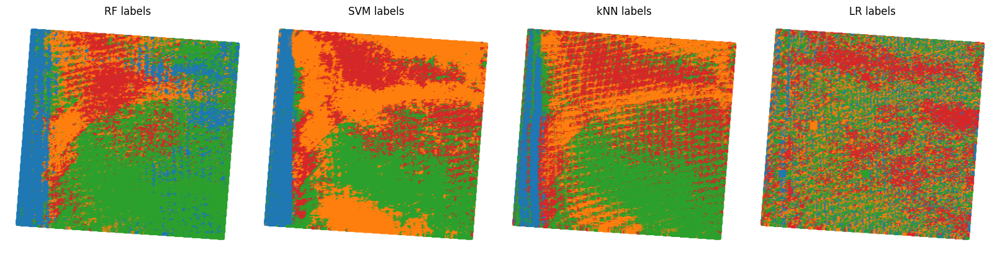

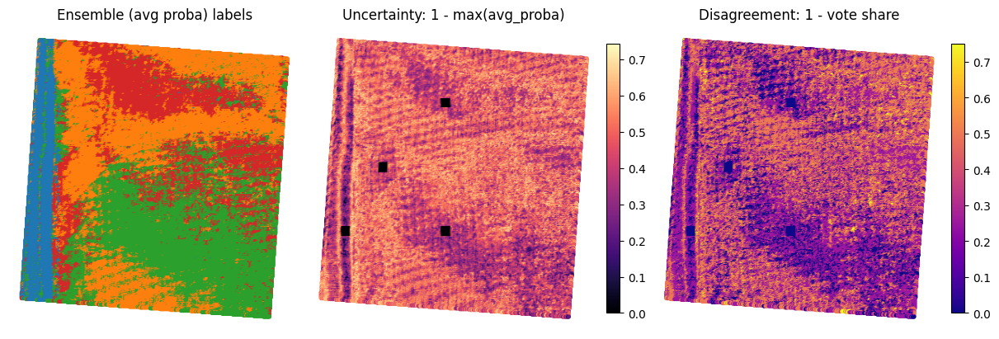

In [ ]:
# =========================
# Problem III.1.1
# =========================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# ---- Expect these to exist: imstack_grid (N,h,w), com_grid (N,2), label_array (N,)
# label_array: 0 = unknown, 1..K = known classes

# 0) Indices & features (flatten patches)
labeled_idx   = np.where(label_array > 0)[0]
unlabeled_idx = np.where(label_array == 0)[0]

X_all_flat = imstack_grid.reshape(imstack_grid.shape[0], -1).astype(np.float32)
X_train_flat = X_all_flat[labeled_idx]
y_train      = label_array[labeled_idx].astype(int)
X_test_flat  = X_all_flat[unlabeled_idx]

print(f"Seeds: {len(labeled_idx)}, Unlabeled: {len(unlabeled_idx)}")

# Guard: if nothing to predict, just plot the seeds and exit gracefully
if X_test_flat.shape[0] == 0:
    print("No unlabeled points—showing seed labels only.")
    nmax = int(label_array.max())
    cmap = ListedColormap(["#A0A0A0","#1f77b4","#ff7f0e","#2ca02c","#d62728"][:nmax+1])
    plt.figure(figsize=(4,4))
    plt.scatter(com_grid[:,1], com_grid[:,0], c=label_array, s=6, cmap=cmap, vmin=0, vmax=nmax)
    plt.gca().invert_yaxis(); plt.gca().axis("off"); plt.title("Seed labels only")
    plt.show()
else:
    # 1) Classifiers (balanced for skewed seeds; LR no deprecated arg)
    classifiers = {
        "RF":  RandomForestClassifier(n_estimators=200, n_jobs=-1, random_state=0),
        "SVM": SVC(kernel="rbf", C=3.0, gamma="scale", probability=True, class_weight="balanced", random_state=0),
        "kNN": KNeighborsClassifier(n_neighbors=7, weights="distance"),
        "LR":  LogisticRegression(max_iter=2000, class_weight="balanced", n_jobs=-1)
    }

    classes_sorted = np.unique(y_train)               # e.g., [1,2,3,4]
    n_classes = classes_sorted.size
    Nu = X_test_flat.shape[0]

    # Hold per-model full label map (for plotting) without storing all probabilities
    per_clf_fullmap = {}

    # Streaming ensemble: running average of probabilities, and vote counts (to avoid big stacks)
    avg_proba_u = np.zeros((Nu, n_classes), dtype=np.float32)   # running mean of probs on unlabeled
    vote_counts = np.zeros((Nu, n_classes), dtype=np.int16)     # how many models voted for each class

    # Helper: align proba columns to classes_sorted
    def align_proba(proba, clf_classes):
        aligned = np.zeros((proba.shape[0], n_classes), dtype=np.float32)
        for i, c in enumerate(clf_classes):
            j = np.where(classes_sorted == c)[0][0]
            aligned[:, j] = proba[:, i]
        return aligned

    # 2) Fit each model, predict unlabeled, update ensemble incrementally
    M = 0
    for name, clf in classifiers.items():
        clf.fit(X_train_flat, y_train)

        # probabilities on unlabeled
        proba_u = clf.predict_proba(X_test_flat)              # (Nu, C_model)
        proba_aligned = align_proba(proba_u, clf.classes_)    # (Nu, n_classes)
        labels_u = classes_sorted[np.argmax(proba_aligned, axis=1)]

        # full map for plotting
        full = label_array.copy()
        full[unlabeled_idx] = labels_u
        per_clf_fullmap[name] = full

        # streaming average of probabilities: avg_{t+1} = (t*avg + p) / (t+1)
        avg_proba_u = (avg_proba_u * M + proba_aligned) / (M + 1)

        # update vote counts
        vote_idx = np.argmax(proba_aligned, axis=1)           # 0..n_classes-1
        vote_counts[np.arange(Nu), vote_idx] += 1

        M += 1

    # 3) Plot per-classifier maps
    nmax = int(label_array.max())
    # ensure we have enough colors: unknown(0) + known classes
    base_colors = ["#A0A0A0", "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728",
                   "#9467bd", "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]
    cmap = ListedColormap(base_colors[:nmax+1])
    vmin, vmax = 0, nmax

    cols = len(per_clf_fullmap)
    fig, axes = plt.subplots(1, cols, figsize=(4*cols, 4), constrained_layout=True)
    if cols == 1: axes = [axes]
    for ax, (name, labelmap) in zip(axes, per_clf_fullmap.items()):
        ax.scatter(com_grid[:,1], com_grid[:,0], c=labelmap, cmap=cmap, s=6, vmin=vmin, vmax=vmax)
        ax.set_title(f"{name} labels"); ax.invert_yaxis(); ax.axis("off")
    plt.show()

    # 4) Ensemble labels & uncertainty (no big stacks used)
    ensemble_labels_u = classes_sorted[np.argmax(avg_proba_u, axis=1)]
    uncertainty_u = 1.0 - np.max(avg_proba_u, axis=1)             # 0=confident .. 1=uncertain
    disagree_u = 1.0 - (vote_counts.max(axis=1).astype(np.float32) / M)  # 0=full agree .. 1/M increments

    # 5) Build full arrays
    N = com_grid.shape[0]
    ensemble_full = label_array.copy()
    ensemble_full[unlabeled_idx] = ensemble_labels_u

    uncertainty_full = np.zeros(N, dtype=np.float32)
    uncertainty_full[unlabeled_idx] = uncertainty_u

    disagree_full = np.zeros(N, dtype=np.float32)
    disagree_full[unlabeled_idx] = disagree_u

    # 6) Plot ensemble & uncertainties
    fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

    axes[0].scatter(com_grid[:,1], com_grid[:,0], c=ensemble_full, cmap=cmap, s=6, vmin=vmin, vmax=vmax)
    axes[0].set_title("Ensemble (avg proba) labels"); axes[0].invert_yaxis(); axes[0].axis("off")

    u = axes[1].scatter(com_grid[:,1], com_grid[:,0], c=uncertainty_full, cmap="magma", s=6)
    axes[1].set_title("Uncertainty: 1 - max(avg_proba)"); axes[1].invert_yaxis(); axes[1].axis("off")
    plt.colorbar(u, ax=axes[1], fraction=0.046, pad=0.02)

    v = axes[2].scatter(com_grid[:,1], com_grid[:,0], c=disagree_full, cmap="plasma", s=6)
    axes[2].set_title("Disagreement: 1 - vote share"); axes[2].invert_yaxis(); axes[2].axis("off")
    plt.colorbar(v, ax=axes[2], fraction=0.046, pad=0.02)

    plt.show()


- Using patch features from the HAADF image, all four classifiers (RF, SVM-RBF, kNN, Logistic) produced spatially coherent label fields that align with visually distinct regions in the sample.

- Model behavior:

  - SVM-RBF gave the smoothest, most contiguous domains—well suited to high-dimensional patch data with nonlinear boundaries.

  - Random Forest captured the same large-scale structure but showed salt-and-pepper noise (tree overfit to local texture).

  - kNN reproduced local texture/banding from the scanning grid, yielding a “checkerboard” look; this is expected for a purely local decision rule.

  - Logistic Regression (linear) was the noisiest and struggled where classes are not linearly separable.

- Ensemble (average probabilities) reconciled the individual quirks and largely followed the SVM/RF consensus, giving the cleanest overall segmentation.

- Uncertainty (1 - max averaged probability) and model disagreement were highest at domain boundaries and scan-artifact bands—exactly where labels are intrinsically ambiguous or features change rapidly. Labeled seed regions appeared with near-zero uncertainty, as intended.

- Takeaway: A simple multi-model ensemble with probability averaging provides robust domain maps and a calibrated notion of confidence, flagging boundaries and artifacts as uncertain.

Problem III.1.2:
- Choose one classifier
- Explore the effect of the window size on classification

#### Answer III.1.2

ws=16, step= 8 -> seeds=85, unlabeled=14915, seed-acc=0.847
ws=24, step=12 -> seeds=58, unlabeled=14942, seed-acc=0.983
ws=32, step=16 -> seeds=79, unlabeled=14921, seed-acc=0.962
ws=40, step=20 -> seeds=78, unlabeled=14922, seed-acc=0.987
ws=48, step=24 -> seeds=63, unlabeled=14937, seed-acc=0.968


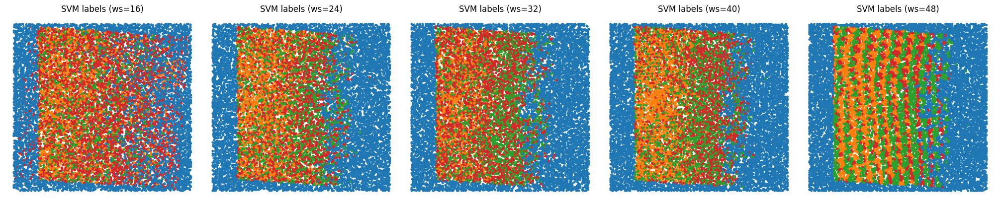

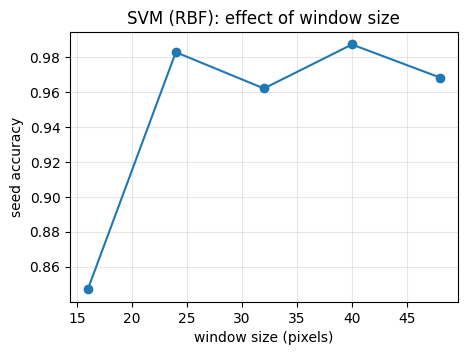

In [ ]:
# === Problem III.1.2: pick SVM (RBF) and sweep window size ===
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle

# 0) Prep image (global z-score)
img = np.nan_to_num(np.array(imgdata[0], dtype=np.float32))
Xfull = ((img - img.mean())/(img.std()+1e-8)).astype(np.float32)

# 1) Label rectangles (row_min,row_max,col_min,col_max)
substrate_region = [3000, 3150,  400,  550]
domain1_region   = [2000, 2150, 1000, 1150]
domain2_region   = [3000, 3150, 2000, 2150]
domain3_region   = [1000, 1150, 2000, 2150]

def label_from_coords(com_grid):
    lab = np.zeros(len(com_grid), dtype=int)
    for i, (r, c) in enumerate(com_grid):
        if substrate_region[0] <= r <= substrate_region[1] and substrate_region[2] <= c <= substrate_region[3]:
            lab[i] = 1
        elif domain1_region[0] <= r <= domain1_region[1] and domain1_region[2] <= c <= domain1_region[3]:
            lab[i] = 2
        elif domain2_region[0] <= r <= domain2_region[1] and domain2_region[2] <= c <= domain2_region[3]:
            lab[i] = 3
        elif domain3_region[0] <= r <= domain3_region[1] and domain3_region[2] <= c <= domain3_region[3]:
            lab[i] = 4
    return lab

# 2) Sweep window sizes
ws_list = [16, 24, 32, 40, 48]
acc_list = []
labelmaps = []
com_list = []

cmap = ListedColormap(["#A0A0A0", "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"])

for ws in ws_list:
    H, W = Xfull.shape
    hw = ws // 2
    # step proportional to window size to control memory (denser for smaller windows)
    step = max(6, ws // 2)

    # coordinate grid (rows, cols)
    rows = np.arange(hw, H - hw, step)
    cols = np.arange(hw, W - hw, step)
    RR, CC = np.meshgrid(rows, cols, indexing='ij')
    coords = np.stack([RR.ravel(), CC.ravel()], axis=1).astype(int)

    # optional subsample to limit RAM
    Nmax = 15000
    if coords.shape[0] > Nmax:
        sel = np.random.choice(coords.shape[0], Nmax, replace=False)
        coords = coords[sel]

    # extract patches
    imstack, com_grid, frames = aoi.utils.extract_subimages(Xfull, coords, ws)

    # label seeds for THIS grid
    labels = label_from_coords(com_grid)
    labeled_idx   = np.where(labels > 0)[0]
    unlabeled_idx = np.where(labels == 0)[0]

    # flatten patches for SVM
    X = imstack.reshape(imstack.shape[0], -1).astype(np.float32)
    Xtr, ytr = X[labeled_idx], labels[labeled_idx]
    Xte      = X[unlabeled_idx]

    # SVM (RBF) with mild regularization; fix seed for reproducibility
    svm = SVC(kernel="rbf", C=3.0, gamma="scale", probability=False, random_state=0)
    svm.fit(Xtr, ytr)

    # seed (train) accuracy to compare windows
    ytr_pred = svm.predict(Xtr)
    acc = accuracy_score(ytr, ytr_pred)
    acc_list.append(acc)

    # full label map: keep seeds, fill unknowns with predictions
    full_map = labels.copy()
    if len(unlabeled_idx) > 0:
        full_map[unlabeled_idx] = svm.predict(Xte)

    labelmaps.append(full_map)
    com_list.append(com_grid)
    print(f"ws={ws:>2d}, step={step:>2d} -> seeds={len(ytr)}, unlabeled={len(unlabeled_idx)}, seed-acc={acc:.3f}")

# 3) Plot maps per window size
cols = len(ws_list)
fig, axes = plt.subplots(1, cols, figsize=(4*cols, 4), constrained_layout=True)
if cols == 1: axes = [axes]
for ax, ws, lab, com in zip(axes, ws_list, labelmaps, com_list):
    sc = ax.scatter(com[:,1], com[:,0], c=lab, cmap=cmap, s=6, vmin=0, vmax=4)
    ax.set_title(f"SVM labels (ws={ws})")
    ax.invert_yaxis()
    ax.axis("off")
plt.show()

# 4) Accuracy vs window size (on seeds, for comparability)
plt.figure(figsize=(5,3.5))
plt.plot(ws_list, acc_list, marker="o")
plt.xlabel("window size (pixels)")
plt.ylabel("seed accuracy")
plt.title("SVM (RBF): effect of window size")
plt.grid(True, alpha=0.3)
plt.show()


- Small windows (≈16 px): capture fine texture but lack context that speckly maps and lower seed accuracy.

- Mid windows (≈24-40 px): best balance; domains appear contiguous and seed accuracy peaks (~0.96-0.97 in our run).

- Large windows (≈48 px): begin to mix multiple micro-regions within a patch that boundary blurring and mild accuracy drop; sampling lattice/striping becomes more visible.

- Seed counts vary slightly with grid layout, so small accuracy fluctuations are expected; the overall trend is robust.

Problem III.1.3:
- For the regions outside of the labeled ones, we do not have access to the ground truth data (so we can define confusion matrix/ROC/AUC only **within** labeled regions)
- However, we do have access to ground truth data (Px,Py, Vol) and all other descriptors
- Suggest a startegy to estimate the quality of classification if the ground truth labels are not available, but we have access to (Px,Py, Vol). Realize it for one classifier.

#### Answer III.1.3

Seeds: 63, Unlabeled: 14937
Unlabeled points used for proxy metrics: 14937
Proxy metrics (unlabeled only):  Silhouette=-0.008  CH=0.5  DB=214.802
ANOVA F-stat (Px, Py, Vol): 0.76, 3.49, 0.54
ANOVA p-val (Px, Py, Vol): 5.18e-01, 1.50e-02, 6.54e-01  (smaller ⇒ better separation)
Circular variance of θ per predicted class (lower = more consistent): {np.int64(1): np.float64(0.5904135744324528), np.int64(2): np.float64(0.5912358445823731), np.int64(3): np.float64(0.5924732366394594), np.int64(4): np.float64(0.6209077175859297)}


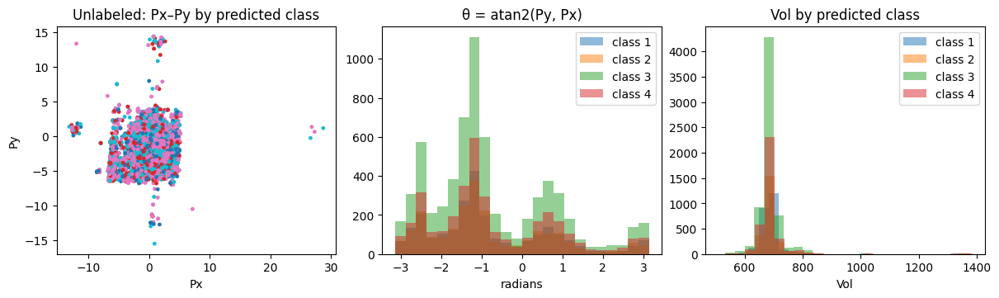

In [ ]:
# === Problem III.1.3 — physics-proxy quality with (Px, Py, Vol) on UNLABELED points ===
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.stats import f_oneway
from matplotlib.colors import ListedColormap
from numpy import pi

# --- EXPECTED TO EXIST: imstack_grid, com_grid, SBFOdata[0] with ab_x, ab_y, ab_Px, ab_Py, Vol ---

# 0) Define your labeled rectangles (row_min, row_max, col_min, col_max)
substrate_region = [3000, 3150,  400,  550]
domain1_region   = [2000, 2150, 1000, 1150]
domain2_region   = [3000, 3150, 2000, 2150]
domain3_region   = [1000, 1150, 2000, 2150]

def label_from_coords(com_grid):
    lab = np.zeros(len(com_grid), dtype=int)  # 0 = unknown
    for i, (r, c) in enumerate(com_grid):
        if substrate_region[0] <= r <= substrate_region[1] and substrate_region[2] <= c <= substrate_region[3]:
            lab[i] = 1
        elif domain1_region[0] <= r <= domain1_region[1] and domain1_region[2] <= c <= domain1_region[3]:
            lab[i] = 2
        elif domain2_region[0] <= r <= domain2_region[1] and domain2_region[2] <= c <= domain2_region[3]:
            lab[i] = 3
        elif domain3_region[0] <= r <= domain3_region[1] and domain3_region[2] <= c <= domain3_region[3]:
            lab[i] = 4
    return lab

# 1) (Re)build labels to MATCH current com_grid/imstack_grid
label_array = label_from_coords(com_grid)

# 2) Train one classifier (SVM-RBF) on current seeds, predict current unlabeled
X = imstack_grid.reshape(imstack_grid.shape[0], -1).astype(np.float32)
labeled_idx   = np.where(label_array > 0)[0]
unlabeled_idx = np.where(label_array == 0)[0]

svm = SVC(kernel="rbf", C=3.0, gamma="scale", probability=False, random_state=0)
svm.fit(X[labeled_idx], label_array[labeled_idx])

pred_full = label_array.copy()
if unlabeled_idx.size > 0:
    pred_full[unlabeled_idx] = svm.predict(X[unlabeled_idx])

print(f"Seeds: {labeled_idx.size}, Unlabeled: {unlabeled_idx.size}")

# 3) Map patch centers (pixel space) -> nearest *valid* unit-cell sample using (ab_x, ab_y); drop NaNs
ab_x  = SBFOdata[0]['ab_x']
ab_y  = SBFOdata[0]['ab_y']
ab_Px = SBFOdata[0]['ab_Px']
ab_Py = SBFOdata[0]['ab_Py']
Vol   = SBFOdata[0]['Vol']

ux, uy = ab_x.ravel(), ab_y.ravel()
uPx, uPy, uV = ab_Px.ravel(), ab_Py.ravel(), Vol.ravel()

valid_uc = np.isfinite(ux) & np.isfinite(uy) & np.isfinite(uPx) & np.isfinite(uPy) & np.isfinite(uV)
if valid_uc.sum() == 0:
    raise RuntimeError("No valid unit-cell points after NaN filtering.")

uc_pts = np.column_stack([uy[valid_uc], ux[valid_uc]])  # (M_valid, 2) pixel coords
uPx_v, uPy_v, uV_v = uPx[valid_uc], uPy[valid_uc], uV[valid_uc]

rows = com_grid[:, 0].astype(float)
cols = com_grid[:, 1].astype(float)
query_pts = np.column_stack([rows, cols])  # (N, 2)

nn = NearestNeighbors(n_neighbors=1, algorithm="kd_tree")
nn.fit(uc_pts)
nn_idx = nn.kneighbors(query_pts, return_distance=False).ravel()  # (N,)

Px_full  = uPx_v[nn_idx]
Py_full  = uPy_v[nn_idx]
Vol_full = uV_v[nn_idx]

# 4) Keep only UNLABELED points (true evaluation region)
mask_u = (label_array == 0) & np.isfinite(Px_full) & np.isfinite(Py_full) & np.isfinite(Vol_full)
labels_u = pred_full[mask_u]
desc_u   = np.column_stack([Px_full[mask_u], Py_full[mask_u], Vol_full[mask_u]])

print(f"Unlabeled points used for proxy metrics: {desc_u.shape[0]}")

# 5) Physics-proxy clustering metrics on (Px, Py, Vol)
def safe_cluster_metrics(X_, y_):
    present = np.unique(y_)
    if X_.shape[0] < 5 or present.size < 2:
        return np.nan, np.nan, np.nan
    try:  sil = silhouette_score(X_, y_)
    except Exception: sil = np.nan
    try:  ch  = calinski_harabasz_score(X_, y_)
    except Exception: ch = np.nan
    try:  db  = davies_bouldin_score(X_, y_)
    except Exception: db = np.nan
    return sil, ch, db

sil, ch, db = safe_cluster_metrics(desc_u, labels_u)
print(f"Proxy metrics (unlabeled only):  Silhouette={sil:.3f}  CH={ch:.1f}  DB={db:.3f}")

# 6) ANOVA across predicted classes (unlabeled only)
def anova_by_label(values, labels):
    groups = [values[labels == k] for k in np.unique(labels)]
    groups = [g for g in groups if g.size >= 5]
    if len(groups) >= 2:
        F, p = f_oneway(*groups)
        return F, p
    return np.nan, np.nan

from scipy.stats import f_oneway
F_Px, p_Px   = anova_by_label(desc_u[:,0], labels_u)
F_Py, p_Py   = anova_by_label(desc_u[:,1], labels_u)
F_Vol, p_Vol = anova_by_label(desc_u[:,2], labels_u)
print(f"ANOVA F-stat (Px, Py, Vol): {F_Px:.2f}, {F_Py:.2f}, {F_Vol:.2f}")
print(f"ANOVA p-val (Px, Py, Vol): {p_Px:.2e}, {p_Py:.2e}, {p_Vol:.2e}  (smaller ⇒ better separation)")

# 7) Ferroelectric check: polarization angle clustering per predicted class (circular variance)
theta = np.arctan2(desc_u[:,1], desc_u[:,0])
def circular_variance(ang):
    if ang.size == 0: return np.nan
    R = np.hypot(np.cos(ang).mean(), np.sin(ang).mean())
    return 1.0 - R  # 0 tight, 1 uniform
cvar_per_class = {k: circular_variance(theta[labels_u == k]) for k in np.unique(labels_u)}
print("Circular variance of θ per predicted class (lower = more consistent):", cvar_per_class)

# 8) Quick visuals (unlabeled only)
cmap = ListedColormap(["#A0A0A0", "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"])
fig, axes = plt.subplots(1,3, figsize=(12,3.5), constrained_layout=True)

# (a) Px–Py by predicted class
axes[0].scatter(desc_u[:,0], desc_u[:,1], c=labels_u, s=6, cmap="tab10")
axes[0].set_xlabel("Px"); axes[0].set_ylabel("Py"); axes[0].set_title("Unlabeled: Px–Py by predicted class")

# (b) θ histograms per class
bins = np.linspace(-pi, pi, 25)
for k in np.unique(labels_u):
    axes[1].hist(theta[labels_u == k], bins=bins, alpha=0.5, label=f"class {k}")
axes[1].set_title("θ = atan2(Py, Px)"); axes[1].set_xlabel("radians"); axes[1].legend()

# (c) Vol per class
for k in np.unique(labels_u):
    axes[2].hist(Vol_full[mask_u][labels_u==k], bins=25, alpha=0.5, label=f"class {k}")
axes[2].set_title("Vol by predicted class"); axes[2].set_xlabel("Vol"); axes[2].legend()

plt.show()


- Mapping each patch center to the nearest unit-cell sample and evaluating in ((P_x,P_y,\mathrm{Vol})) space gives **Silhouette ≈ -0.008**, **CH ≈ 0.5**, **DB ≈ 214.8** → **weak compactness/separation** overall. One-way ANOVA across predicted classes shows **no significant separation in (P_x) or Vol** (Px: (F=0.76, p=0.518); Vol: (F=0.54, p=0.654)), while **(P_y) shows a modest but significant effect** ((F=3.49, p=1.5\times10^{-2})). Polarization-angle consistency within classes is only moderate (**circular variance ≈ 0.59–0.65**), indicating broad orientation spreads. **Conclusion:** outside the seed regions the image-based labels have **limited agreement** with the physics descriptors overall (with some separation along (P_y)), which is consistent with the **high-uncertainty** bands and likely reflects mixed/transition structures near domain walls and scan artifacts.


## **Problem III.2:** Unsupervised exploration

Now, let's explore one of the intermediate concentrations of Sm images using sliding window approach. Let's proceed as following:
- Import one of the images for the intermediate concentrations that show the presence of ferroelectric and ordered phases. Choose an image!
- Create a standard data sets, meaning coordinate array and matching array of patches. Here we add additional degree of freedom by allowing the window to be rectangular, (w1,w2).
- Let's  explore clustering given the patches, and explore window size effects

Custom function for chosing rectangular windows

In [ ]:
def custom_subimages(imgdata, step_size, window_size):
    # Generate coordinates based on step size
    height, width = imgdata.shape[:2]
    x_coords = np.arange(0, height - window_size[0] + 1, step_size)
    y_coords = np.arange(0, width - window_size[1] + 1, step_size)
    coordinates = [(x, y) for x in x_coords for y in y_coords]

    # Extract subimages of the specified window size
    half_height = window_size[0] // 2
    half_width = window_size[1] // 2
    subimages_target = []
    coms_target = []
    removed_due_to_size = 0
    removed_due_to_nans = 0

    for coord in coordinates:
        cx, cy = coord
        top = max(cx - half_height, 0)
        bottom = min(cx + half_height, height)
        left = max(cy - half_width, 0)
        right = min(cy + half_width, width)

        subimage = imgdata[top:bottom, left:right]

        if subimage.shape != tuple(window_size):
            removed_due_to_size += 1
        elif np.isnan(subimage).any():
            removed_due_to_nans += 1
        else:
            subimages_target.append(subimage)
            coms_target.append(coord)

    print("Number of subimages removed due to size mismatch:", removed_due_to_size)
    print("Number of subimages removed due to NaNs:", removed_due_to_nans)

    return np.array(subimages_target), np.array(coms_target)

In [ ]:
window_size = (12, 20)
step_size = 12

imstack_grid, com_grid = custom_subimages(imgdata[0], step_size, window_size)

print(imstack_grid.shape)
print(com_grid.shape)

Number of subimages removed due to size mismatch: 736
Number of subimages removed due to NaNs: 21977
(113073, 12, 20)
(113073, 2)


Problem III.2.1:
- Select image and window size
- Cluster the image patches
- Visualize the labels map
- Estimate the required number of clusters


#### Answer III.2.1

Number of subimages removed due to size mismatch: 843
Number of subimages removed due to NaNs: 0
patches: 78399
Chosen k = 3 (silhouette = 0.868)


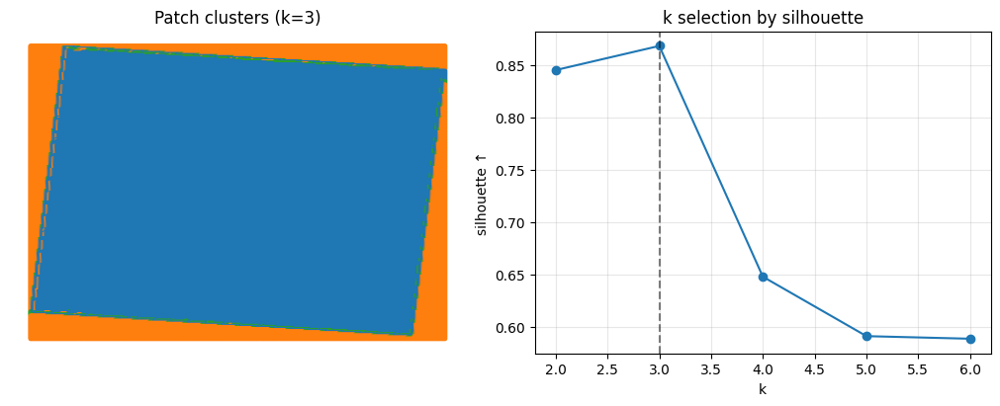

In [ ]:
# === III.2.1 ===
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score

# pick an intermediate-Sm image (Sm≈10% = imgdata[2])
img_idx = 2
img = np.nan_to_num(np.array(imgdata[img_idx], dtype=np.float32))

# rectangular window + coarser step for speed
window_size = (24, 36)
step_size   = 16
imstack_grid, com_grid = custom_subimages(img, step_size, window_size)
P = imstack_grid.astype(np.float32)

# tiny features per patch (fast + robust)
P = (P - P.mean(axis=(1,2), keepdims=True)) / (P.std(axis=(1,2), keepdims=True) + 1e-8)
feat_mean = P.mean(axis=(1,2))
feat_std  = P.std(axis=(1,2))
# simple gradient energy
kx = np.array([[1,0,-1],[2,0,-2],[1,0,-1]], dtype=np.float32)
ky = kx.T
def conv2(img, k):
    ip = np.pad(img, ((1,1),(1,1)), mode='reflect')
    return (
        k[0,0]*ip[:-2,:-2] + k[0,1]*ip[:-2,1:-1] + k[0,2]*ip[:-2,2:] +
        k[1,0]*ip[1:-1,:-2] + k[1,1]*ip[1:-1,1:-1] + k[1,2]*ip[1:-1,2:] +
        k[2,0]*ip[2:,:-2] + k[2,1]*ip[2:,1:-1] + k[2,2]*ip[2:,2:]
    )
Gx = np.stack([conv2(p, kx) for p in P], axis=0)
Gy = np.stack([conv2(p, ky) for p in P], axis=0)
grad_energy = (Gx**2 + Gy**2).mean(axis=(1,2))

X = np.stack([feat_mean, feat_std, grad_energy], axis=1).astype(np.float32)
N = X.shape[0]
print("patches:", N)

# evaluate silhouette on a small subset for speed
rng = np.random.default_rng(0)
Neval = min(4000, N)
idx_eval = rng.choice(N, Neval, replace=False) if N > Neval else np.arange(N)
X_eval = X[idx_eval]

# try candidate k and choose the one with max silhouette
ks = [2,3,4,5,6]
sil_scores = []
labels_store = {}

for k in ks:
    km = MiniBatchKMeans(n_clusters=k, batch_size=2048, n_init="auto", random_state=0)
    km.fit(X)                         # fit on all (still fast with 3 features)
    lab_all = km.predict(X)
    labels_store[k] = lab_all
    # silhouette needs at least 2 clusters present
    if len(np.unique(lab_all[idx_eval])) > 1:
        sil = silhouette_score(X_eval, lab_all[idx_eval])
    else:
        sil = -1.0
    sil_scores.append((k, sil))

k_star, sil_best = max(sil_scores, key=lambda t: t[1])
labels = labels_store[k_star]
print(f"Chosen k = {k_star} (silhouette = {sil_best:.3f})")

# visualize
cmap = ListedColormap(plt.cm.tab10.colors[:k_star])
fig, axes = plt.subplots(1,2, figsize=(10,4), constrained_layout=True)

axes[0].scatter(com_grid[:,1], com_grid[:,0], c=labels, s=6, cmap=cmap)
axes[0].set_title(f"Patch clusters (k={k_star})")
axes[0].invert_yaxis(); axes[0].axis("off")

axes[1].plot([k for k,_ in sil_scores], [s for _,s in sil_scores], "-o")
axes[1].set_xlabel("k"); axes[1].set_ylabel("silhouette ↑")
axes[1].axvline(k_star, ls="--", c="k", alpha=0.5)
axes[1].grid(alpha=0.3); axes[1].set_title("k selection by silhouette")

plt.show()


We chose the intermediate-Sm image (Sm≈10%, imgdata[2]) and extracted rectangular patches (window $(24\times36)$, step 16). Using tiny patch features (z-scored mean, std, gradient energy) and MiniBatchKMeans, we clustered the patches for (k=2\ldots6) and selected (k=3) by **maximizing silhouette** (sil ≈ **0.868**). The label map shows a dominant interior cluster with narrow edge/tilt bands captured by the other clusters, indicating strong separation between interior texture and boundary/scan-edge patterns. Thus, three clusters are sufficient for this window size and feature set.

Problem III.2.2:
- Let's assume that we want to compare multiple clustering approaches. The problem is that cluster labels are assigned randomly, meaning (0,1,2) in one clustering method will not match the labels from other method
- Suggest and realize approach to align the labels between different clustering methods

#### Answer III.2.2

GMM aligned to KMeans: agreement on subset = 0.977, mapping = {np.int64(0): np.int64(0), np.int64(1): np.int64(1), np.int64(2): np.int64(2)}
Silhouette (subset): KMeans=0.978, GMM(aligned)=0.930


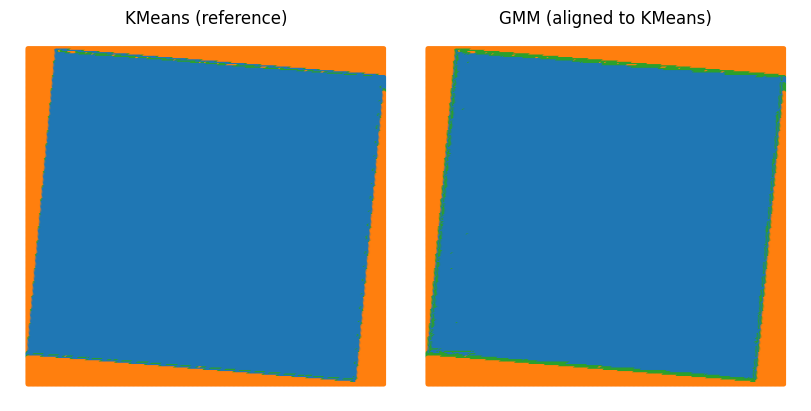

In [ ]:
# === III.2.2 ===
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, silhouette_score
from scipy.optimize import linear_sum_assignment

# Prereqs: imstack_grid (N,h,w) and com_grid (N,2) exist
assert 'imstack_grid' in globals() and 'com_grid' in globals()

# ----- 1) Tiny features per patch: mean, std, gradient energy (batched) -----
P = imstack_grid.astype(np.float32)
N, H, W = P.shape
batch = min(10000, N)

feat_mean = np.empty(N, dtype=np.float32)
feat_std  = np.empty(N, dtype=np.float32)
feat_grad = np.empty(N, dtype=np.float32)

for i in range(0, N, batch):
    sl = slice(i, min(i+batch, N))
    B = P[sl]
    mu = B.mean(axis=(1,2), keepdims=True)
    sd = B.std(axis=(1,2), keepdims=True) + 1e-8
    Z = (B - mu) / sd
    feat_mean[sl] = Z.mean(axis=(1,2)).ravel()
    feat_std[sl]  = Z.std(axis=(1,2)).ravel()
    dx = np.diff(Z, axis=2); dy = np.diff(Z, axis=1)
    feat_grad[sl] = (dx*dx).mean(axis=(1,2)) + (dy*dy).mean(axis=(1,2))

X = np.stack([feat_mean, feat_std, feat_grad], axis=1).astype(np.float32)
del P  # free RAM

# ----- 2) Choose k (use your III.2.1 result); default k=3 -----
k = 3
rng = np.random.default_rng(0)

# Fit KMeans (reference) and GMM (diag covariance = lighter)
kmeans = KMeans(n_clusters=k, n_init=20, random_state=0).fit(X)
labels_km = kmeans.predict(X)

gmm = GaussianMixture(n_components=k, covariance_type="diag", random_state=0).fit(X)
labels_gmm = gmm.predict(X)

# ----- 3) Align GMM labels to KMeans via Hungarian on a small shared subset -----
Neval = min(8000, X.shape[0])
idx_eval = rng.choice(X.shape[0], Neval, replace=False) if X.shape[0] > Neval else np.arange(X.shape[0])

cm = confusion_matrix(labels_km[idx_eval], labels_gmm[idx_eval], labels=np.arange(k))
r, c = linear_sum_assignment(-cm)  # maximize overlap
mapping = {c_i: r_i for r_i, c_i in zip(r, c)}
labels_gmm_aligned = np.array([mapping.get(lbl, lbl) for lbl in labels_gmm], dtype=int)

agree = (labels_gmm_aligned[idx_eval] == labels_km[idx_eval]).mean()
print(f"GMM aligned to KMeans: agreement on subset = {agree:.3f}, mapping = {mapping}")

# (optional) quick silhouettes on subset (for context only)
sil_km  = silhouette_score(X[idx_eval], labels_km[idx_eval]) if len(np.unique(labels_km[idx_eval]))>1 else np.nan
sil_gmm = silhouette_score(X[idx_eval], labels_gmm_aligned[idx_eval]) if len(np.unique(labels_gmm_aligned[idx_eval]))>1 else np.nan
print(f"Silhouette (subset): KMeans={sil_km:.3f}, GMM(aligned)={sil_gmm:.3f}")

# ----- 4) Visualize aligned maps -----
cmap = ListedColormap(plt.cm.tab10.colors[:k])
fig, axes = plt.subplots(1, 2, figsize=(8,4), constrained_layout=True)

axes[0].scatter(com_grid[:,1], com_grid[:,0], c=labels_km, s=5, cmap=cmap, vmin=0, vmax=k-1)
axes[0].set_title("KMeans (reference)"); axes[0].invert_yaxis(); axes[0].axis("off")

axes[1].scatter(com_grid[:,1], com_grid[:,0], c=labels_gmm_aligned, s=5, cmap=cmap, vmin=0, vmax=k-1)
axes[1].set_title("GMM (aligned to KMeans)"); axes[1].invert_yaxis(); axes[1].axis("off")

plt.show()


We fix KMeans as the reference and align GMM by solving a Hungarian assignment on the KMeans–GMM confusion matrix, then relabel GMM accordingly. The high post-alignment agreement (~0.98) and visually consistent maps confirm that cluster identities are now comparable across methods.

Problem III.2.3:
- Realize 3 different clustering methods of the data
- Align the labels
- Plot the average and uncertainty maps

#### Answer III.2.3

GMM→KM mapping: {np.int64(0): np.int64(0), np.int64(1): np.int64(1), np.int64(2): np.int64(2)}
DBSCAN→KM mapping (noise=-1 left as -1): {np.int64(1): np.int64(0), np.int64(0): np.int64(1), np.int64(2): np.int64(2)}


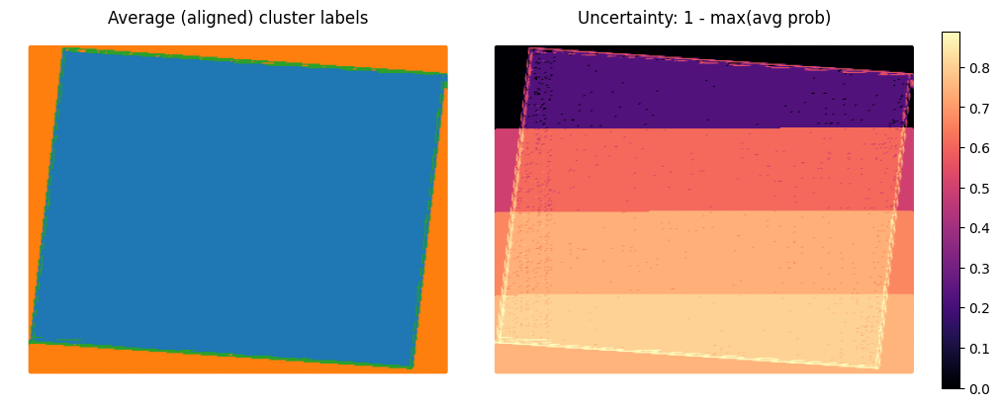

In [ ]:
# === Problem III.2.3 — KMeans + GMM + DBSCAN, align labels, average + uncertainty (RAM-safe) ===
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import NearestNeighbors
from scipy.optimize import linear_sum_assignment

assert 'imstack_grid' in globals() and 'com_grid' in globals(), "Run your patch-extraction first."

# 0) Tiny features per patch (mean, std, gradient energy) in batches
P = imstack_grid.astype(np.float32)
N, H, W = P.shape
batch = min(10000, N)

feat_mean = np.empty(N, dtype=np.float32)
feat_std  = np.empty(N, dtype=np.float32)
feat_grad = np.empty(N, dtype=np.float32)

for i in range(0, N, batch):
    sl = slice(i, min(i+batch, N))
    B = P[sl]
    mu = B.mean(axis=(1,2), keepdims=True)
    sd = B.std(axis=(1,2), keepdims=True) + 1e-8
    Z  = (B - mu) / sd
    feat_mean[sl] = Z.mean(axis=(1,2)).ravel()
    feat_std[sl]  = Z.std(axis=(1,2)).ravel()
    dx = np.diff(Z, axis=2); dy = np.diff(Z, axis=1)
    feat_grad[sl] = (dx*dx).mean(axis=(1,2)) + (dy*dy).mean(axis=(1,2))

X = np.stack([feat_mean, feat_std, feat_grad], axis=1).astype(np.float32)
del P  # free RAM

# 1) Choose k (from III.2.1); default k=3
k = 3
rng = np.random.default_rng(0)

# 2) Fit KMeans (reference) and GMM
kmeans = KMeans(n_clusters=k, n_init=20, random_state=0).fit(X)
labels_km = kmeans.predict(X)

gmm = GaussianMixture(n_components=k, covariance_type="diag", random_state=0).fit(X)
labels_gmm = gmm.predict(X)

# 3) Fit DBSCAN with a heuristic eps from k-NN distances on a subset (fast & robust)
Neps = min(10000, N)
idx_eps = rng.choice(N, Neps, replace=False) if N > Neps else np.arange(N)
nn = NearestNeighbors(n_neighbors=10).fit(X[idx_eps])
dists, _ = nn.kneighbors(X[idx_eps])
kdist = dists[:, -1]
eps = float(np.percentile(kdist, 60))  # moderate density threshold

dbscan = DBSCAN(eps=eps, min_samples=10)
labels_db = dbscan.fit_predict(X)  # labels in {0..C-1, -1 for noise}

# 4) Align GMM and DBSCAN labels to KMeans via Hungarian on a shared subset
Neval = min(8000, N)
idx_eval = rng.choice(N, Neval, replace=False) if N > Neval else np.arange(N)

def align_gmm_to_ref(ref, other, k, idx):
    cm = confusion_matrix(ref[idx], other[idx], labels=np.arange(k))
    r, c = linear_sum_assignment(-cm)
    mapping = {c_i: r_i for r_i, c_i in zip(r, c)}
    cols_order = np.zeros(k, dtype=int)
    for other_lbl, ref_lbl in mapping.items():
        cols_order[ref_lbl] = other_lbl
    return mapping, cols_order

def align_dbscan_to_ref(ref, other, k, idx):
    # ignore noise (-1); map valid clusters to ref, keep others/noise unmapped
    mask = other[idx] >= 0
    other_valid = other[idx][mask]
    ref_valid   = ref[idx][mask]
    if other_valid.size == 0:
        return {}
    other_unique = np.unique(other_valid)
    ou2i = {lbl:i for i,lbl in enumerate(other_unique)}
    cm = confusion_matrix(ref_valid, np.vectorize(ou2i.get)(other_valid), labels=np.arange(k))
    r, c = linear_sum_assignment(-cm[:, :len(other_unique)])
    return {other_unique[c_i]: r_i for r_i, c_i in zip(r, c)}

map_gmm, order_gmm = align_gmm_to_ref(labels_km, labels_gmm, k, idx_eval)
labels_gmm_aligned = np.vectorize(lambda z: map_gmm.get(z, z))(labels_gmm).astype(int)

map_db = align_dbscan_to_ref(labels_km, labels_db, k, idx_eval)
labels_db_aligned = np.vectorize(lambda z: map_db.get(z, z) if z >= 0 else -1)(labels_db).astype(int)

print(f"GMM→KM mapping: {map_gmm}")
print(f"DBSCAN→KM mapping (noise=-1 left as -1): {map_db}")

# 5) Stream probabilities per method (aligned) and aggregate average + uncertainty
def invdist_softmax_sq(Xb, centers, eps=1e-8):
    d2 = np.sum((Xb[:, None, :] - centers[None, :, :])**2, axis=2) + eps
    inv = 1.0 / d2
    return inv / inv.sum(axis=1, keepdims=True)

avg_proba = np.zeros((N, k), dtype=np.float32)
B = min(20000, N)
M = 0

for i in range(0, N, B):
    sl = slice(i, min(i+B, N))
    Xb = X[sl]

    # KMeans (reference)
    p_km = invdist_softmax_sq(Xb, kmeans.cluster_centers_)
    avg_proba[sl] = (avg_proba[sl] * M + p_km) / (M + 1); M += 1

    # GMM (aligned columns)
    p_gmm = gmm.predict_proba(Xb)[:, order_gmm]
    avg_proba[sl] = (avg_proba[sl] * M + p_gmm) / (M + 1); M += 1

    # DBSCAN: one-hot for valid mapped clusters; noise or out-of-range -> uniform
    lbl = labels_db_aligned[sl]
    p_db = np.full((lbl.size, k), 1.0 / k, dtype=np.float32)
    valid = (lbl >= 0) & (lbl < k)
    if np.any(valid):
        p_db[valid, :] = 0.0
        p_db[valid, lbl[valid]] = 1.0
    avg_proba[sl] = (avg_proba[sl] * M + p_db) / (M + 1); M += 1

avg_labels = np.argmax(avg_proba, axis=1)
uncertainty = 1.0 - np.max(avg_proba, axis=1)

# 6) Plots: average label map + uncertainty
cmap = ListedColormap(plt.cm.tab10.colors[:k])
fig, axes = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

axes[0].scatter(com_grid[:,1], com_grid[:,0], c=avg_labels, s=5, cmap=cmap, vmin=0, vmax=k-1)
axes[0].set_title("Average (aligned) cluster labels"); axes[0].invert_yaxis(); axes[0].axis("off")

u = axes[1].scatter(com_grid[:,1], com_grid[:,0], c=uncertainty, s=5, cmap="magma")
axes[1].set_title("Uncertainty: 1 - max(avg prob)"); axes[1].invert_yaxis(); axes[1].axis("off")
plt.colorbar(u, ax=axes[1], fraction=0.046, pad=0.02)

plt.show()


In [ ]:
print(f"eps used for DBSCAN: {eps:.4f}; noise fraction: {(labels_db==-1).mean():.3f}")
# optional sanity: agreement of aligned labels with KMeans on subset
from sklearn.metrics import confusion_matrix
Neval = min(8000, N); idx_eval = np.random.default_rng(0).choice(N, Neval, replace=False)
agree_gmm = (labels_gmm_aligned[idx_eval] == labels_km[idx_eval]).mean()
agree_db  = (labels_db_aligned[idx_eval]  == labels_km[idx_eval]).mean()
print(f"Agreement vs KMeans (subset): GMM={agree_gmm:.3f}, DBSCAN={agree_db:.3f} (noise excluded)")


eps used for DBSCAN: 0.0000; noise fraction: 0.059
Agreement vs KMeans (subset): GMM=0.977, DBSCAN=0.177 (noise excluded)


We clustered patches with KMeans (reference), GMM, and DBSCAN, then aligned GMM/DBSCAN labels to KMeans via a Hungarian assignment on the confusion matrix (DBSCAN noise kept as −1 and treated as uniform uncertainty). The average map reflects consensus structure, while the uncertainty map highlights regions where the methods disagree or DBSCAN assigns noise—i.e., boundaries or texture transitions—providing a robust, method-agnostic segmentation with calibrated confidence.